In [1]:
from matplotlib import pyplot as plt
import numpy as np
import pandas as pd
import geopandas as gpd
import altair as alt

In [2]:
pd.options.display.max_columns = 999

# Week 9A: OpenStreetMap, Urban Networks, and Interactive Web Maps
Oct 31, 2022

## Happy Halloween!

<img src="https://media.giphy.com/media/3oriNYMXEh2K5l4D9C/giphy.gif"></img>

## Housekeeping

- HW #4 (optional) due today by the end of the day
- HW #5 (optional) posted today — due in two weeks on Nov. 14
- Final project details posted and **we will discuss on Wednesday**: https://github.com/MUSA-550-Fall-2022/final-project

## Today: OpenStreetMap (OSM)

- Two tools that make working with OSM data very easy
- What kind of questions can we answer?
    - Street orientations 
    - Mapping event points to streets: car crashes
    - Mapping amenities
    - Network-constrained distances: accessibility

## OSM: what is it?

- Collaborative mapping
- A free editable map of the World
- Sort of like Wikipedia for maps

**Great source of data: street networks and a wealth of amenity information**

https://www.openstreetmap.org

## Working with OSM data

- Raw data is very messy
- Two relatively new, amazing Python packages greatly simply the process
- Related, but complementary features    
    - **OSMnx:** downloading and manipulating streets as networks
    - **Pandana:** networks focused on accessibility of amenities
    
**Related:** interactive web maps in Python

## Part 1: OSMnx

Several key features: 

- Downloading political boundaries for cities, states, countries, etc
- Downloading street networks
- Analyzing networks: routing, visualization, statistics

  - [GitHub](https://github.com/gboeing/osmnx)
  - [Introductory Blog Post](https://geoffboeing.com/2016/11/osmnx-python-street-networks/)
  - [Jupyter Notebook Examples](https://github.com/gboeing/osmnx-examples/tree/master/notebooks) ([Binder](https://mybinder.org/v2/gh/gboeing/osmnx-examples/main?urlpath=/tree/notebooks))
  - [Documentation](https://osmnx.readthedocs.io)

In [3]:
import osmnx as ox

## 1.1. Getting boundary shapefiles from OSM

Key function: `geocode_to_gdf()` ([docs](https://osmnx.readthedocs.io/en/stable/osmnx.html#osmnx.geocoder.geocode_to_gdf))

We can get the boundary for anything identified as a "place" by OSM.

**Important: Be careful to pass the right place name that OSM needs**

In [7]:
philly = ox.geocode_to_gdf('Philadelphia, PA')
philly.head() 

,geometry,bbox_north,bbox_south,bbox_east,bbox_west,place_id,osm_type,osm_id,lat,lon,display_name,class,type,importance
0,"POLYGON ((-75.28030 39.97500, -75.28022 39.974...",40.137959,39.867005,-74.955831,-75.280298,282365563,relation,188022,39.952724,-75.163526,"Philadelphia, Philadelphia County, Pennsylvani...",boundary,administrative,0.823797


In [9]:
philly.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

We can plot it just like any other GeoDataFrame

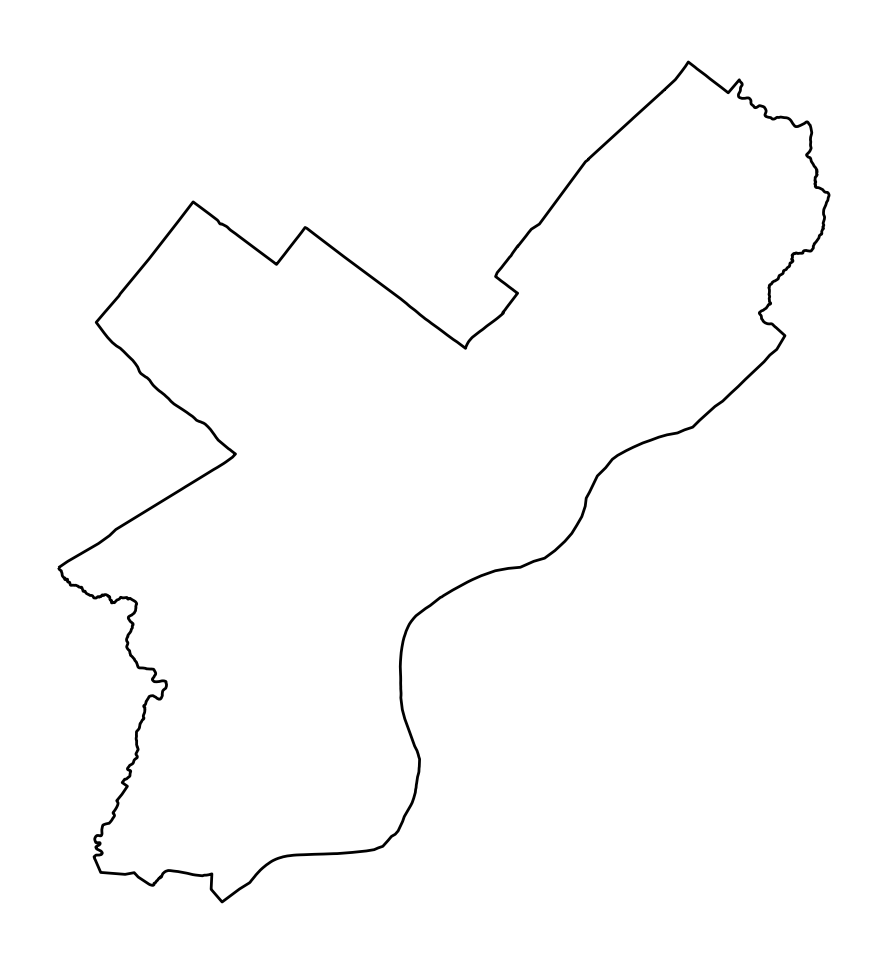

In [8]:
# Project it to Web Mercator first and plot
ax = philly.to_crs(epsg=3857).plot(facecolor='none', edgecolor='black') 
ax.set_axis_off()

## 1.2 Projecting with OSMnx

Key function: `project_gdf()` ([docs](https://osmnx.readthedocs.io/en/stable/osmnx.html#osmnx.projection.project_gdf))

Automatically projects to the [Universal Transverse Mercator](https://en.wikipedia.org/wiki/Universal_Transverse_Mercator_coordinate_system) (UTM) CRS for the UTM zone that the centroid of the polygon lies in 

A good, general projection that works for most latitudes except very northern locations.

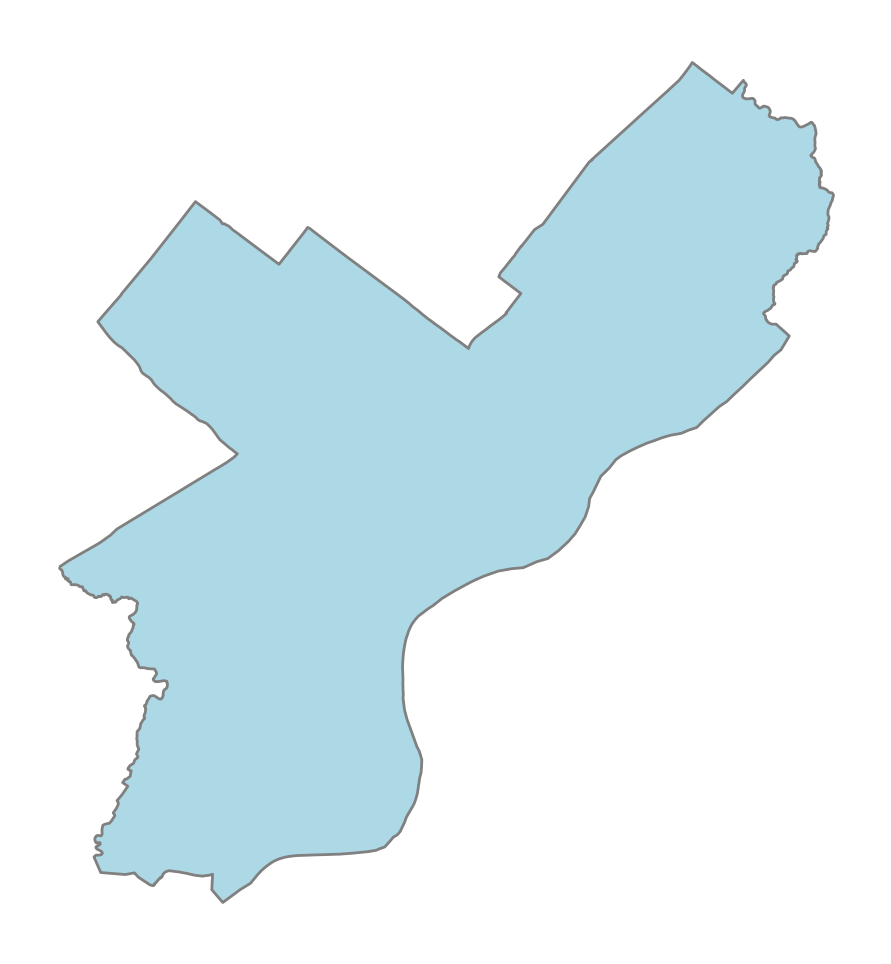

In [10]:
ax = ox.project_gdf(philly).plot(fc="lightblue", ec="gray")
ax.set_axis_off()

Some more examples:

In [11]:
# Some examples
place1 = ox.geocode_to_gdf('Manhattan, New York City, New York, USA')
place2 = ox.geocode_to_gdf('Miami-Dade County, Florida')
place3 = ox.geocode_to_gdf('Florida, USA')
place4 = ox.geocode_to_gdf('Spain')

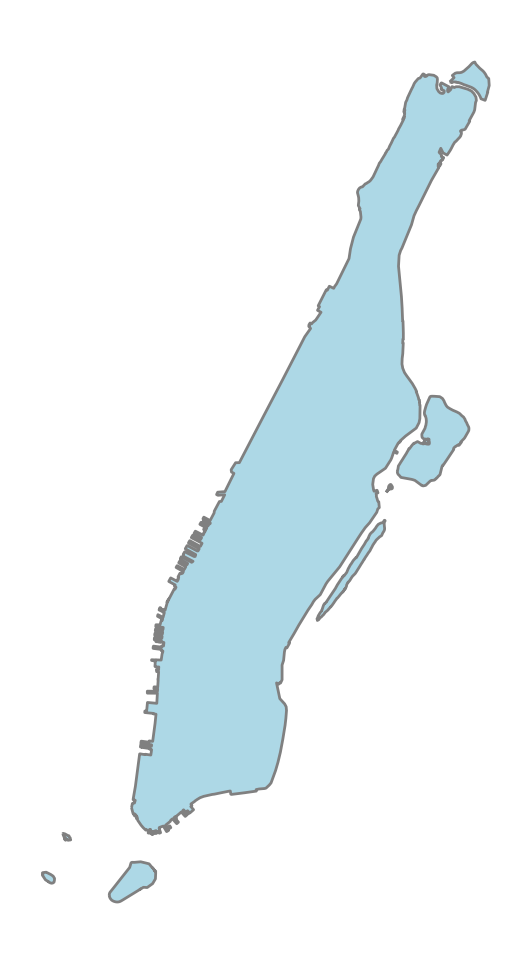

In [12]:
# Manhattan
ax = ox.project_gdf(place1).plot(fc="lightblue", ec="gray");
ax.set_axis_off()

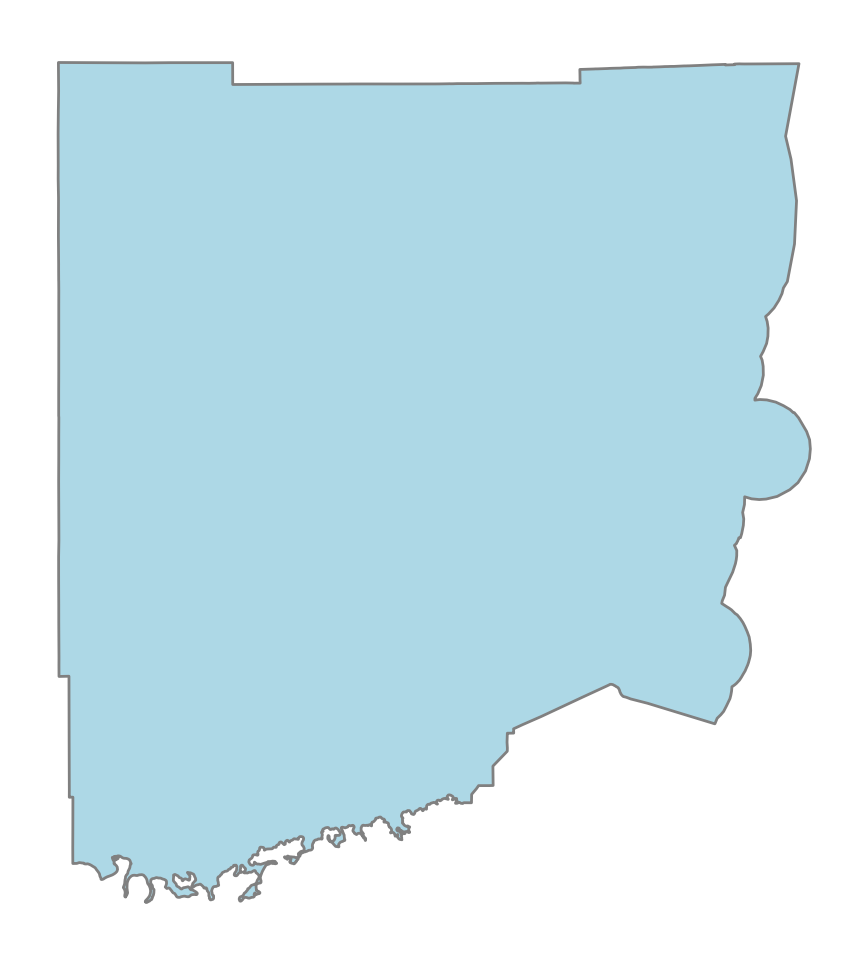

In [13]:
# Miami-Dade County
ax = ox.project_gdf(place2).plot(fc="lightblue", ec="gray")
ax.set_axis_off()

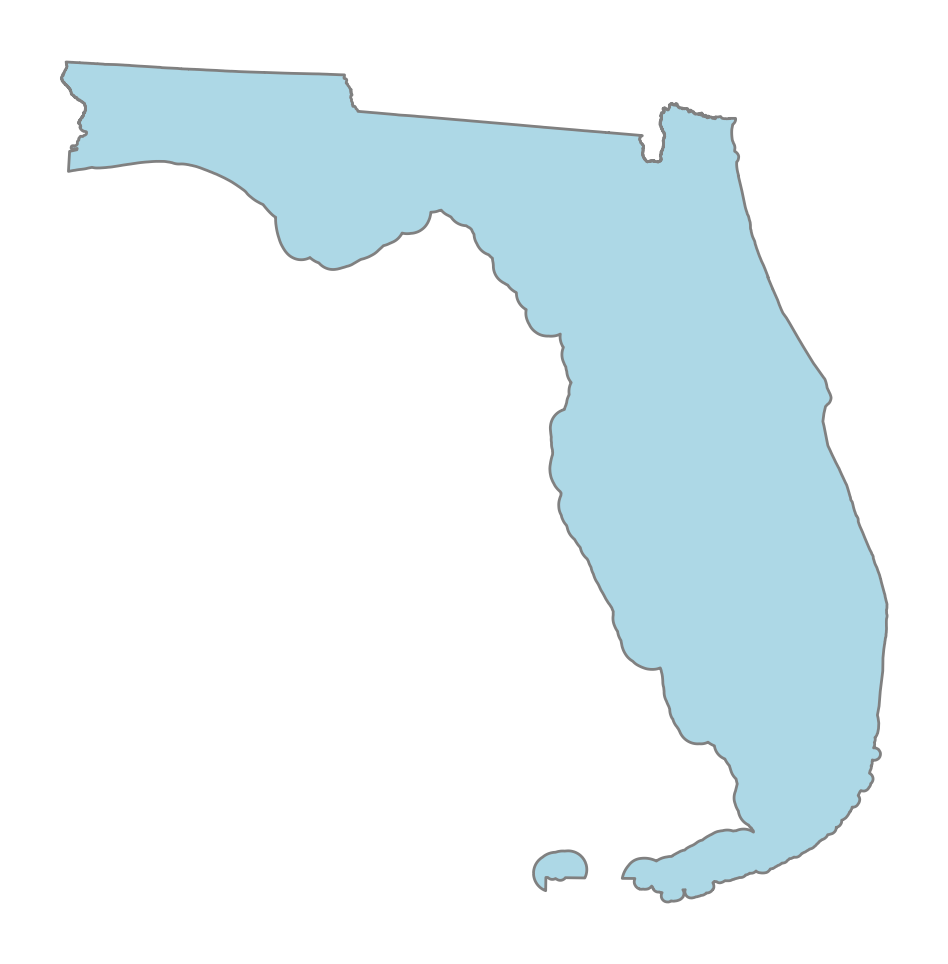

In [95]:
# Florida
ax = ox.project_gdf(place3).plot(fc="lightblue", ec="gray")
ax.set_axis_off()

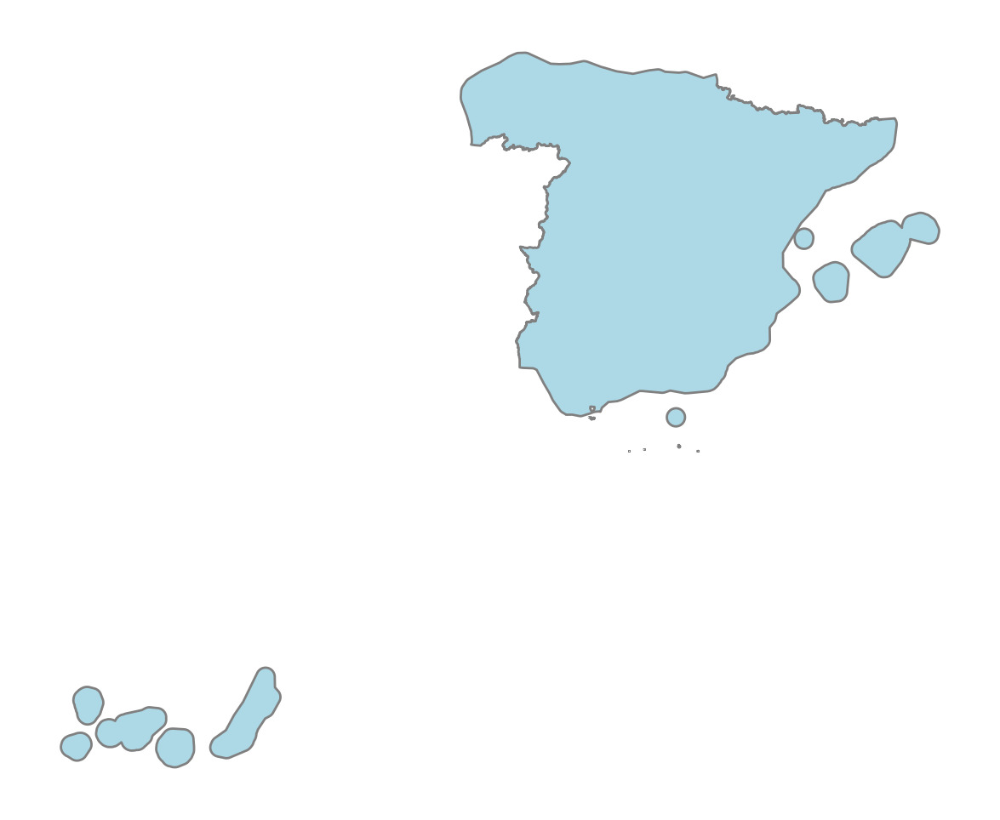

In [96]:
# Spain
ax = ox.project_gdf(place4).plot(fc="lightblue", ec="gray")
ax.set_axis_off()

## 1.3 Downloading OSM features

Key functions: `geometries_from_*`

- `geometries_from_place()` ([docs](https://osmnx.readthedocs.io/en/stable/osmnx.html#osmnx.geometries.geometries_from_place))
     - Download geometries within an OSM place boundary
- `geometries_from_address()` ([docs](https://osmnx.readthedocs.io/en/stable/osmnx.html#osmnx.geometries.geometries_from_address))
    - Download geometries within a certain distance of an address
- `geometries_from_bbox()` ([docs](https://osmnx.readthedocs.io/en/stable/osmnx.html#osmnx.geometries.geometries_from_bbox))
    - Download geometries within a N, S, E, W bounding box
- `geometries_from_point()` ([docs](https://osmnx.readthedocs.io/en/stable/osmnx.html#osmnx.geometries.geometries_from_point)) 
    - Download geometries within a certain distance of a specified point
- `geometries_from_polygon()` ([docs](https://osmnx.readthedocs.io/en/stable/osmnx.html#osmnx.geometries.geometries_from_polygon))
    - Download geometries within a polygon object

### About OSM features

**Important reference:** https://wiki.openstreetmap.org/wiki/Map_Features

- OSM uses a *tagging* system to categorize different map features
- The main feature categories are available on the OSM Wikipedia
    - Examples: 'amenity', 'building', 'landuse', 'highway'
- There are specific sub-categories for each feature type too:
    - Amenity examples: 'bar', 'college', 'library'

In the language of OSM, the "key" is the main feature category (e.g., amenity) and the "value" is the sub-category type (e.g., "bar")

### OSMnx mirrors the key/value syntax

Use a dict to specify the features you want: 

In [14]:
# Get all amenities in Philadelphia
amenities = ox.geometries_from_place("Philadelphia, PA", tags={"amenity": True})

len(amenities)

9913

In [15]:
amenities.head()

highway                    geometry  \
element_type osmid                                                    
node         109811385              NaN  POINT (-75.19487 40.05846)   
             109993125  traffic_signals  POINT (-75.19107 40.06019)   
             274215467              NaN  POINT (-75.19492 39.95935)   
             274216093              NaN  POINT (-75.19126 39.95765)   
             274216804              NaN  POINT (-75.19844 39.95571)   

                          amenity direction     created_by cuisine  \
element_type osmid                                                   
node         109811385      bench       NaN            NaN     NaN   
             109993125        pub       NaN            NaN     NaN   
             274215467  fast_food       NaN  Potlatch 0.9c   pizza   
             274216093        atm       NaN            NaN     NaN   
             274216804        pub       NaN  Potlatch 0.9c     NaN   

                                      name     brand brand:wikidata  \
element_type osmid                                                    
node         109811385                 NaN       NaN            NaN   
             109993125                 NaN       NaN            NaN   
             274215467      Powelton Pizza       NaN            NaN   
             274216093            Citibank  Citibank        Q857063   
             274216804  Brownie's 38th St.       NaN            NaN   

                       brand:wikipedia  operator operator:wikidata  \
element_type osmid                                                   
node         109811385             NaN       NaN               NaN   
             109993125             NaN       NaN               NaN   
             274215467             NaN       NaN               NaN   
             274216093     en:Citibank  Citibank           Q857063   
             274216804             NaN       NaN               NaN   

                       operator:wikipedia         shop short_name addr:city  \
element_type osmid                                                            
node         109811385                NaN          NaN        NaN       NaN   
             109993125                NaN          NaN        NaN       NaN   
             274215467                NaN          NaN        NaN       NaN   
             274216093        en:Citibank  convenience       Citi       NaN   
             274216804                NaN          NaN        NaN       NaN   

                       addr:housenumber addr:postcode addr:state addr:street  \
element_type osmid                                                             
node         109811385              NaN           NaN        NaN         NaN   
             109993125              NaN           NaN        NaN         NaN   
             274215467              NaN           NaN        NaN         NaN   
             274216093              NaN           NaN        NaN         NaN   
             274216804              NaN           NaN        NaN         NaN   

                       official_name opening_hours phone takeaway source  \
element_type osmid                                                         
node         109811385           NaN           NaN   NaN      NaN    NaN   
             109993125           NaN           NaN   NaN      NaN    NaN   
             274215467           NaN           NaN   NaN      NaN    NaN   
             274216093           NaN           NaN   NaN      NaN    NaN   
             274216804           NaN           NaN   NaN      NaN    NaN   

                       wheelchair healthcare internet_access  url  \
element_type osmid                                                  
node         109811385        NaN        NaN             NaN  NaN   
             109993125        NaN        NaN             NaN  NaN   
             274215467        NaN        NaN             NaN  NaN   
             274216093        NaN        NaN             NaN 

In [17]:
# Get all bars in philadelphia
bars = ox.geometries_from_place("Philadelphia, PA", tags={"amenity": "bar"})

len(bars)

156

In [100]:
bars.head()

addr:city addr:housenumber addr:postcode  \
element_type osmid                                                     
node         357303425   Philadelphia              500         19123   
             655425272            NaN              NaN           NaN   
             1167079387           NaN              NaN           NaN   
             1204761128           NaN              NaN           NaN   
             1424271155           NaN              344         19147   

                        addr:state           addr:street amenity brewery  \
element_type osmid                                                         
node         357303425          PA  Spring Garden Street     bar     yes   
             655425272         NaN                   NaN     bar     NaN   
             1167079387        NaN                   NaN     bar     NaN   
             1204761128        NaN                   NaN     bar     NaN   
             1424271155        NaN          South Street     bar     NaN   

                           craft gnis:county_id microbrewery  \
element_type osmid                                             
node         357303425   brewery            101          yes   
             655425272       NaN            NaN          NaN   
             1167079387      NaN            NaN          NaN   
             1204761128      NaN            NaN          NaN   
             1424271155      NaN            NaN          NaN   

                                             name               operator  \
element_type osmid                                                         
node         357303425      Yards Brewing Company  Yards Brewing Company   
             655425272              Drinkers West                    NaN   
             1167079387                   Milkboy                    NaN   
             1204761128  Vikings High School Club                    NaN   
             1424271155                Copabanana                    NaN   

                        restaurant                    website   wikidata  \
element_type osmid                                                         
node         357303425         yes  https://yardsbrewing.com/  Q16903914   
             655425272         NaN                        NaN        NaN   
             1167079387        NaN                        NaN        NaN   
             1204761128        NaN                        NaN        NaN   
             1424271155        NaN     http://copabanana.com/        NaN   

                                        wikipedia                    geometry  \
element_type osmid                                                              
node         357303425   en:Yards Brewing Company  POINT (-75.14712 39.96067)   
             655425272                        NaN  POINT (-75.20020 39.95521)   
             1167079387                       NaN  POINT (-75.14925 39.94170)   
             1204761128                       NaN  POINT (-75.16363 39.92685)   
             1424271155                       NaN  POINT (-75.14909 39.94152)   

                             opening_hours           phone smoking  \
element_type osmid                                                   
node         357303425                 NaN             NaN     NaN   
             655425272                 NaN             NaN     NaN   
             1167079387                NaN             NaN     NaN   
             1204761128                NaN             NaN     NaN   
             1424271155  Mo-Su 11:30-02:00  +1 215 9236180     NaN   

                        toilets:wheelchair wheelchair addr:housename  \
element_type osmid                                                     
node         357303425                 NaN        NaN            NaN   
             655425272                 NaN        NaN            NaN   
             1167079387                NaN        NaN            NaN   
             1204761128                NaN        NaN   

In [18]:
# Get bar, pub, and restaurant features in Philadelphia
food_and_drink = ox.geometries_from_place("Philadelphia, PA", tags={"amenity": ["pub", "bar", "restaurant"]})

len(food_and_drink)

1031

In [102]:
food_and_drink.head()

amenity          highway  \
element_type osmid                                    
node         109993125         pub  traffic_signals   
             274216804         pub              NaN   
             333786044  restaurant              NaN   
             343293806         pub              NaN   
             357303425         bar              NaN   

                                          geometry      created_by  \
element_type osmid                                                   
node         109993125  POINT (-75.19107 40.06019)             NaN   
             274216804  POINT (-75.19844 39.95571)   Potlatch 0.9c   
             333786044  POINT (-75.15893 39.94086)  Potlatch 0.10f   
             343293806  POINT (-75.15946 39.96073)             NaN   
             357303425  POINT (-75.14712 39.96067)             NaN   

                                         name     source wheelchair  \
element_type osmid                                                    
node         109993125                    NaN        NaN        NaN   
             274216804     Brownie's 38th St.        NaN        NaN   
             333786044    Sam's Morning Glory  knowledge    limited   
             343293806    Prohibition Taproom     survey        NaN   
             357303425  Yards Brewing Company        NaN        NaN   

                           addr:city addr:housenumber addr:postcode  \
element_type osmid                                                    
node         109993125           NaN              NaN           NaN   
             274216804           NaN              NaN           NaN   
             333786044           NaN              NaN           NaN   
             343293806  Philadelphia              501         19123   
             357303425  Philadelphia              500         19123   

                       addr:state           addr:street brewery  \
element_type osmid                                                
node         109993125        NaN                   NaN     NaN   
             274216804        NaN                   NaN     NaN   
             333786044        NaN                   NaN     NaN   
             343293806         PA     North 13th Street     yes   
             357303425         PA  Spring Garden Street     yes   

                            opening_hours    craft gnis:county_id  \
element_type osmid                                                  
node         109993125                NaN      NaN            NaN   
             274216804                NaN      NaN            NaN   
             333786044                NaN      NaN            NaN   
             343293806  Mo-Su 11:00-02:00      NaN            NaN   
             357303425                NaN  brewery            101   

                       microbrewery               operator restaurant  \
element_type osmid                                                      
node         109993125          NaN                    NaN        NaN   
             274216804          NaN                    NaN        NaN   
             333786044          NaN                    NaN        NaN   
             343293806          NaN                    NaN        NaN   
             357303425          yes  Yards Brewing Company        yes   

                                          website   wikidata  \
element_type osmid                                             
node         109993125                        NaN        NaN   
             274216804                        NaN        NaN   
             333786044                        NaN        NaN   
             343293806                        NaN        NaN   
             357303425  https://yardsbrewing.com/  Q16903914   

                                       wikipedia cuisine outdoor_seating  \
element_type osmid                                                         
node         109993125                       NaN     NaN             NaN   
           

In [19]:
# Get higway bus stop features
bus_stops = ox.geometries_from_place("Philadelphia, PA", tags={"highway": "bus_stop"})

len(bus_stops)

286

In [20]:
bus_stops.head()

bus   highway public_transport  \
element_type osmid                                        
node         109812837   yes  bus_stop         platform   
             361011456   yes  bus_stop         platform   
             750281693   yes  bus_stop         platform   
             768271130   yes  bus_stop         platform   
             1015342921  yes  bus_stop         platform   

                                           geometry bench covered  \
element_type osmid                                                  
node         109812837   POINT (-75.19363 40.05964)   NaN     NaN   
             361011456   POINT (-75.16166 39.95223)   yes     yes   
             750281693   POINT (-75.07732 40.01797)   NaN     NaN   
             768271130   POINT (-75.20726 40.01487)   NaN     NaN   
             1015342921  POINT (-75.18187 39.96640)   NaN     NaN   

                                                      name network  \
element_type osmid                                                   
node         109812837                                 NaN     NaN   
             361011456                 13th St & Market St   SEPTA   
             750281693                                 NaN     NaN   
             768271130   Wissahickon Transportation Center   SEPTA   
             1015342921                                NaN     NaN   

                        network:wikidata operator shelter network:wikipedia  \
element_type osmid                                                            
node         109812837               NaN      NaN     NaN               NaN   
             361011456          Q2037863    SEPTA     yes               NaN   
             750281693               NaN      NaN     NaN               NaN   
             768271130          Q2037863    SEPTA     yes               NaN   
             1015342921              NaN      NaN     NaN               NaN   

                         ref tactile_paving wheelchair route_ref local_ref  \
element_type osmid                                                           
node         109812837   NaN            NaN        NaN       NaN       NaN   
             361011456   NaN            NaN        NaN       NaN       NaN   
             750281693   NaN            NaN        NaN       NaN       NaN   
             768271130   NaN            NaN        NaN       NaN       NaN   
             1015342921  NaN            NaN        NaN       NaN       NaN   

                        designation source  bin  lit departures_board  \
element_type osmid                                                      
node         109812837          NaN    NaN  NaN  NaN              NaN   
             361011456          NaN    NaN  NaN  NaN              NaN   
             750281693          NaN    NaN  NaN  NaN              NaN   
             768271130          NaN    NaN  NaN  NaN              NaN   
             1015342921         NaN    NaN  NaN  NaN              NaN   

                        internet_access addr:street route_ref_1 note  \
element_type osmid                                                     
node         109812837              NaN         NaN         NaN  NaN   
             361011456              NaN         NaN         NaN  NaN   
             750281693              NaN         NaN         NaN  NaN   
             768271130              NaN         NaN         NaN  NaN   
             1015342921             NaN         NaN         NaN  NaN   

                        operator:wikidata brand brand:wikidata railway tram  \
element_type osmid                                                            
node         109812837                NaN   NaN            NaN     NaN  NaN   
             361011456                NaN   NaN            NaN     NaN  NaN   
             750281693                NaN   NaN            NaN     NaN  NaN   
             768271130                NaN   NaN            NaN     NaN  NaN   
             1015342921               NaN   

In [21]:
# Get commercial and retail landuse features
landuse = ox.geometries_from_place("Philadelphia, PA", tags={"landuse": ["commercial", "retail"]})

len(landuse)

333

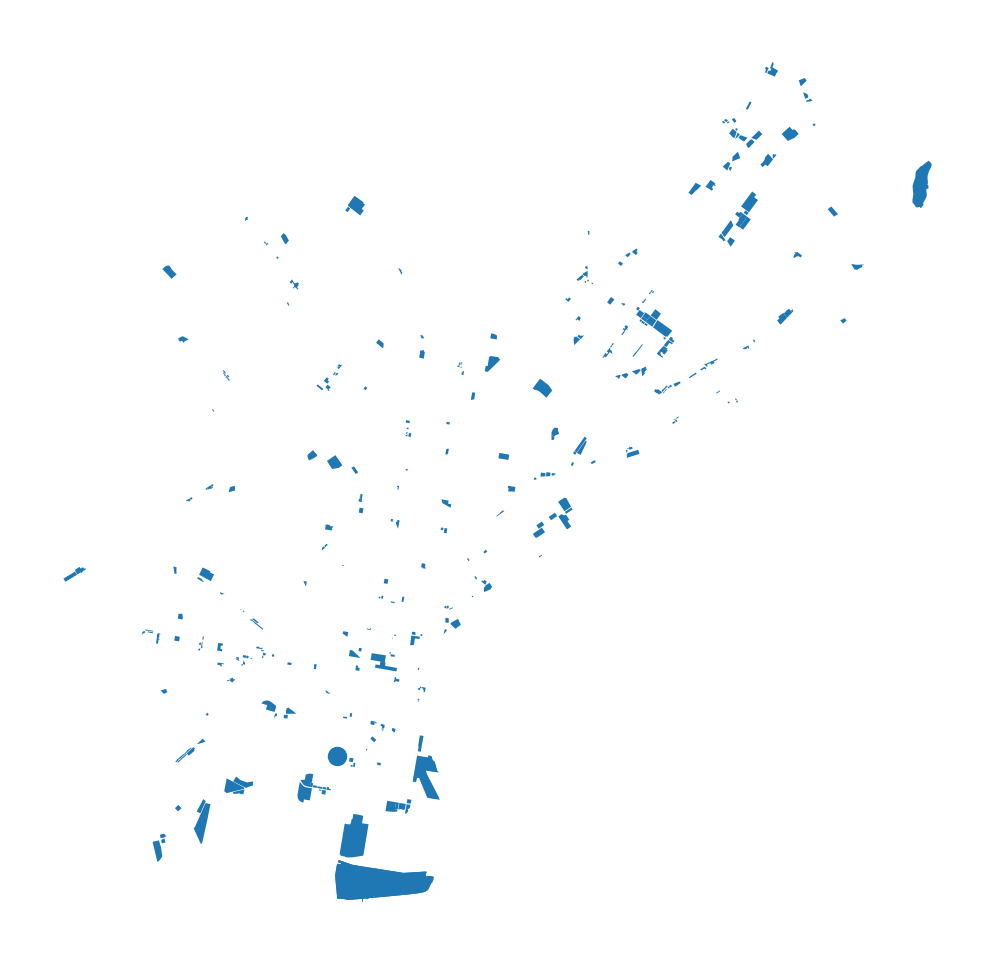

In [22]:
fig, ax = plt.subplots(figsize=(10, 6))

ax = landuse.plot(ax=ax)
ax.set_axis_off()

## 1.4 Downloading street networks

Key functions: `graph_from_*` 

- `graph_from_place()` ([docs](https://osmnx.readthedocs.io/en/stable/osmnx.html#osmnx.graph.graph_from_place))
     - Download street network within an OSM place boundary
- `graph_from_address()` ([docs](https://osmnx.readthedocs.io/en/stable/osmnx.html#osmnx.graph.graph_from_address))
    - Download street network within a certain distance of an address
- `graph_from_bbox()` ([docs](https://osmnx.readthedocs.io/en/stable/osmnx.html#osmnx.graph.graph_from_bbox))
    - Download street network within a N, S, E, W bounding box
- `graph_from_point()` ([docs](https://osmnx.readthedocs.io/en/stable/osmnx.html#osmnx.graph.graph_from_point)) 
    - Download street network within a certain distance of a specified point
- `graph_from_polygon()` ([docs](https://osmnx.readthedocs.io/en/stable/osmnx.html#osmnx.graph.graph_from_polygon))
    - Download street network within a polygon object

### Street network around an address

Get streets within 500 meters of the center of Northern Liberties

In [23]:
G = ox.graph_from_address("Northern Liberties, Philadelphia, PA", dist=500)

Project and plot it:

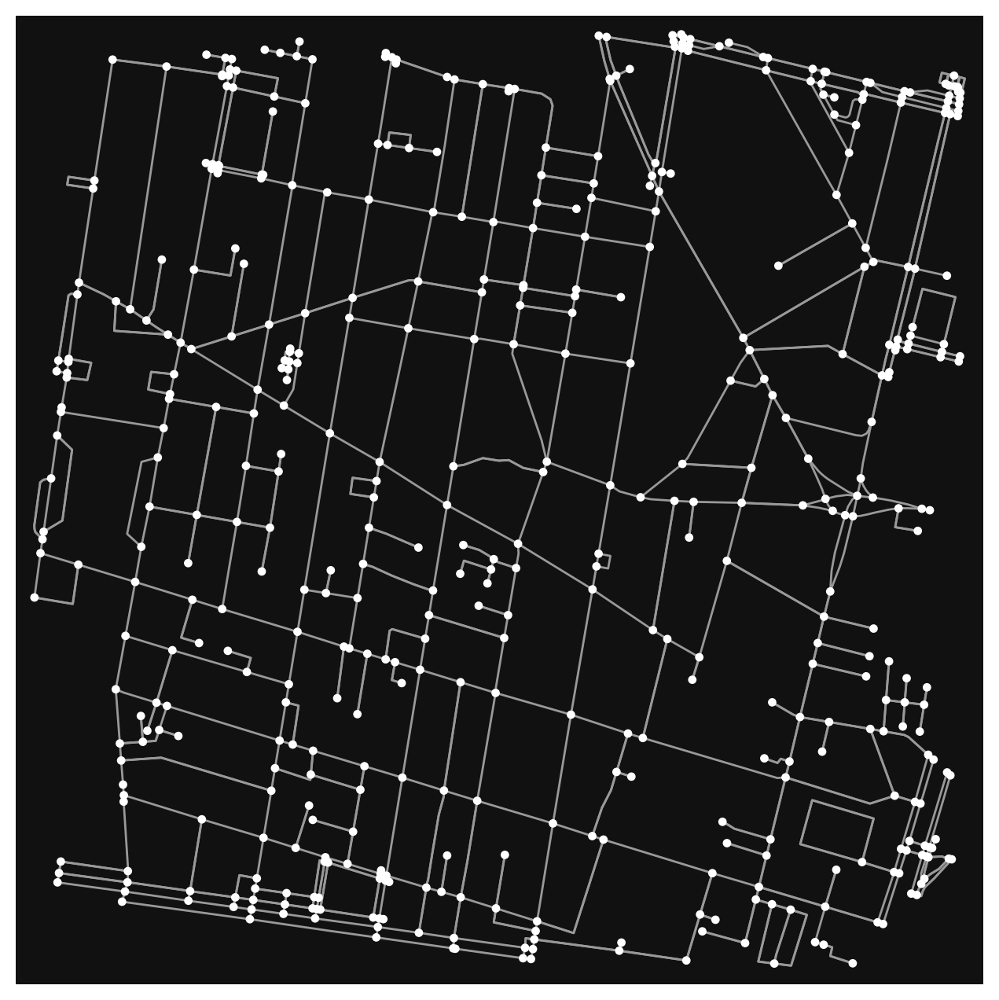

In [25]:
G_projected = ox.project_graph(G)
ox.plot_graph(G_projected);

Remove the nodes:

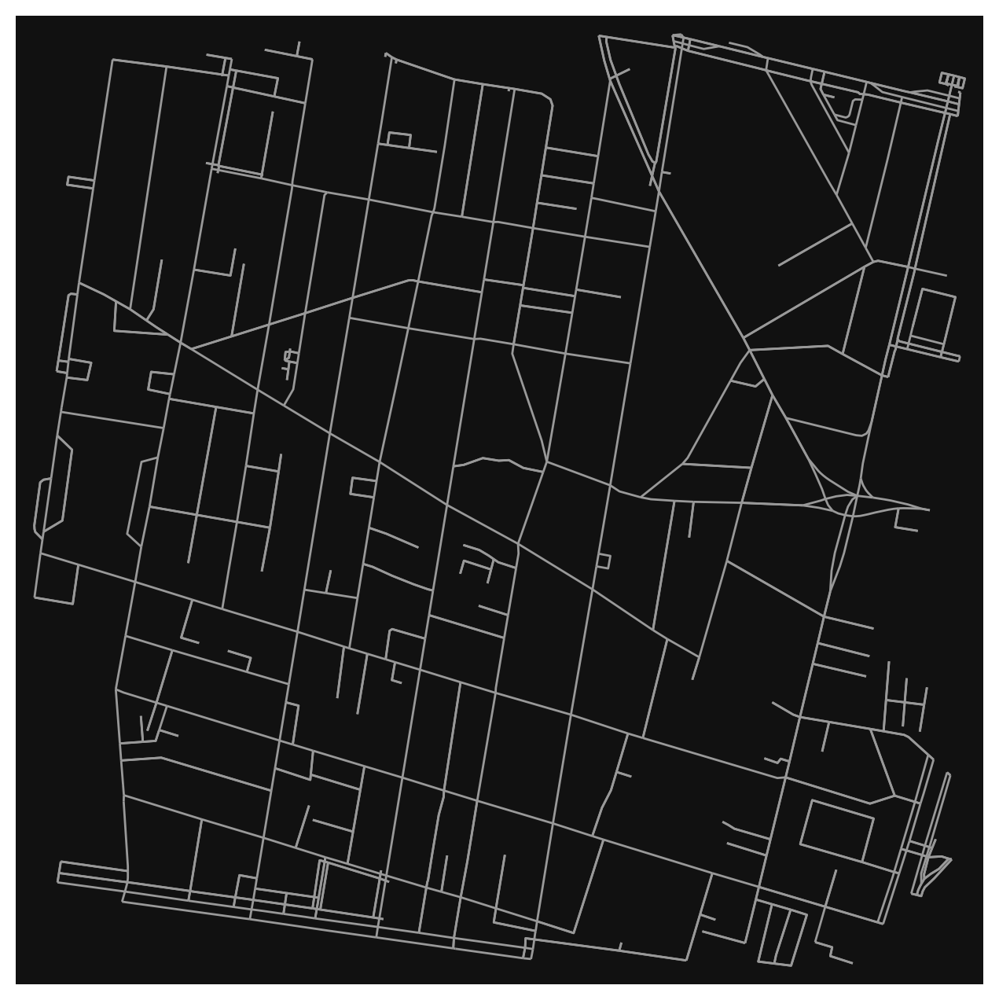

In [27]:
ox.plot_graph(G_projected, node_size=0);

Let's zoom out to 2,000 meters. This will take a little longer.

In [28]:
G = ox.graph_from_address("Northern Liberties, Philadelphia, PA", dist=2000)
G_projected = ox.project_graph(G)

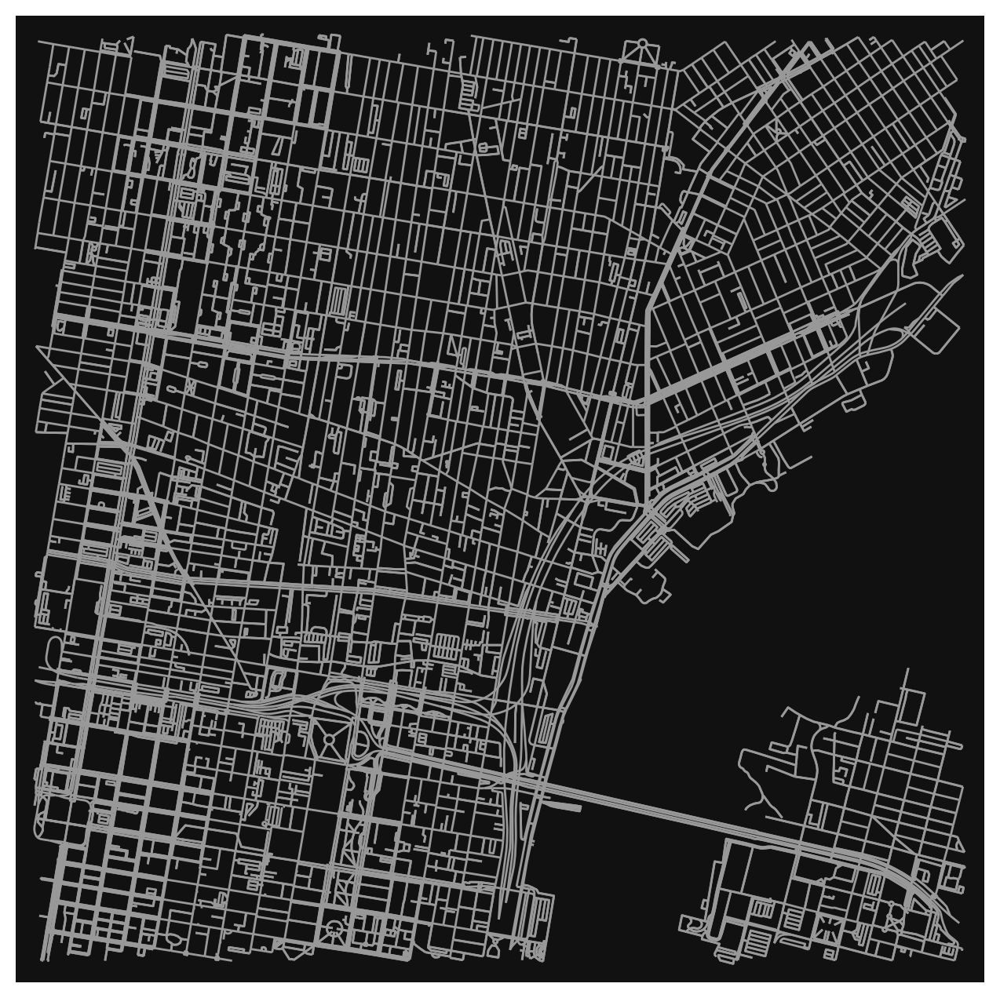

In [29]:
ox.plot_graph(G_projected, node_size=0);

### Getting different network types

- `drive` - get drivable public streets (but not service roads)
- `drive_service` - get drivable streets, including service roads
- `walk` - get all streets and paths that pedestrians can use (this network type ignores one-way directionality)
- `bike` - get all streets and paths that cyclists can use
- `all` - download all non-private OSM streets and paths
- `all_private` - download all OSM streets and paths, including private-access ones (default)

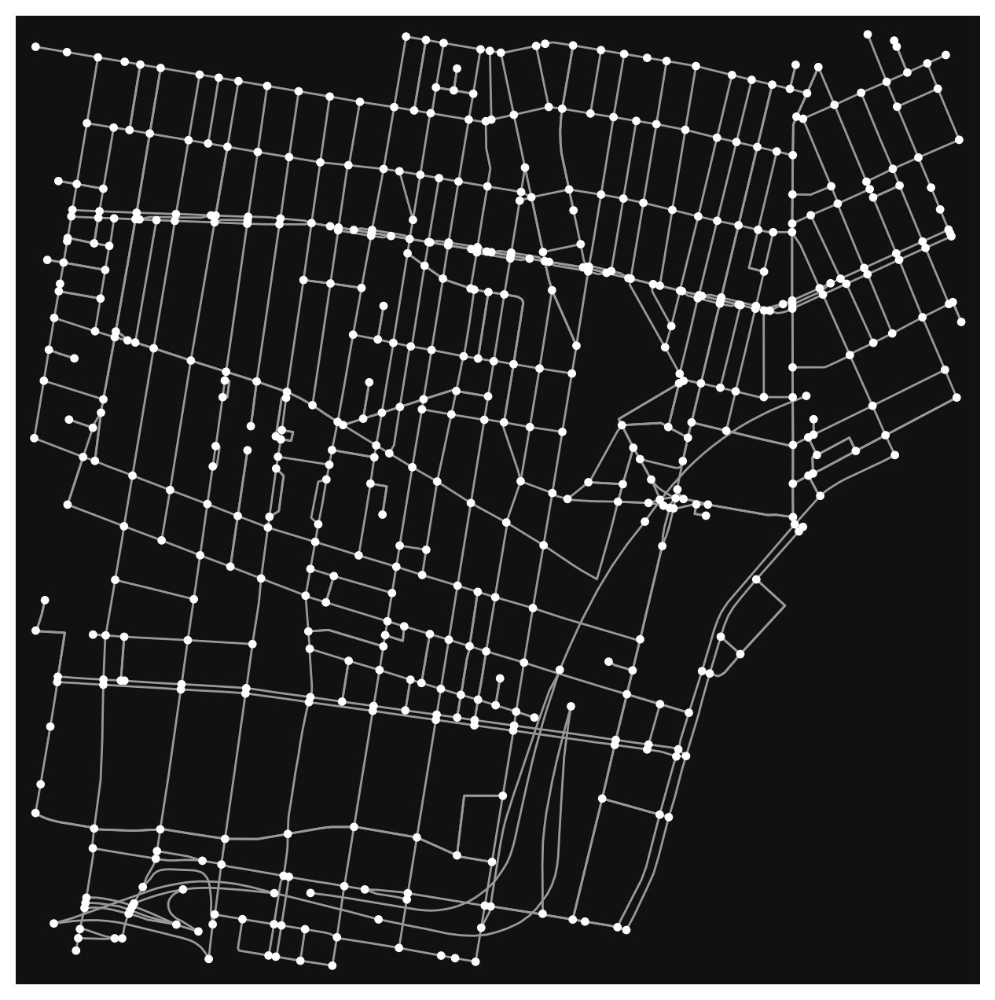

In [30]:
# the "drive" network
G = ox.graph_from_address("Northern Liberties, Philadelphia, PA", 
                          network_type='drive')
ox.plot_graph(G);

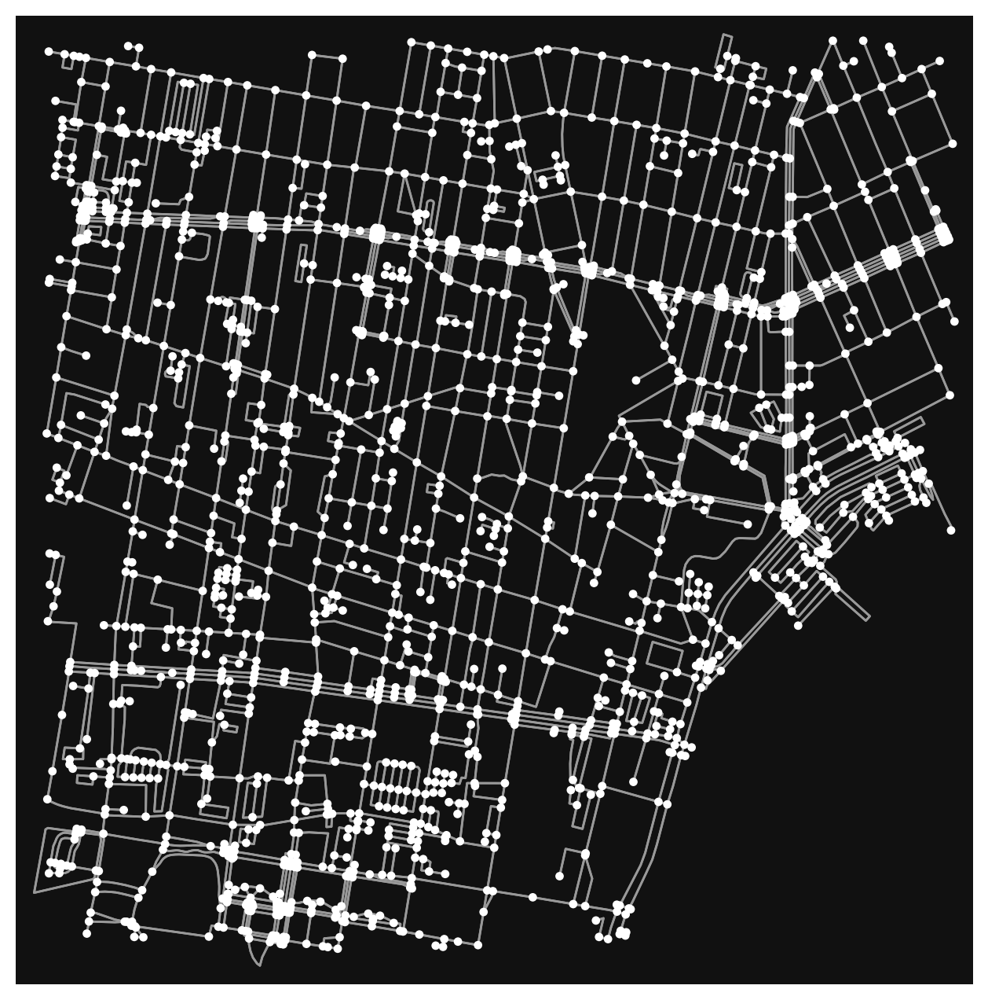

In [31]:
# the "walk" network
G = ox.graph_from_address("Northern Liberties, Philadelphia, PA", 
                           network_type='walk')
ox.plot_graph(ox.project_graph(G));

### Street network within a place boundary

Use `graph_from_place()` to get the streets within a specific OSM place.

**Note: the place query has to be resolved by OSM.**

In [32]:
berkeley = ox.graph_from_place("Berkeley, California, USA",)

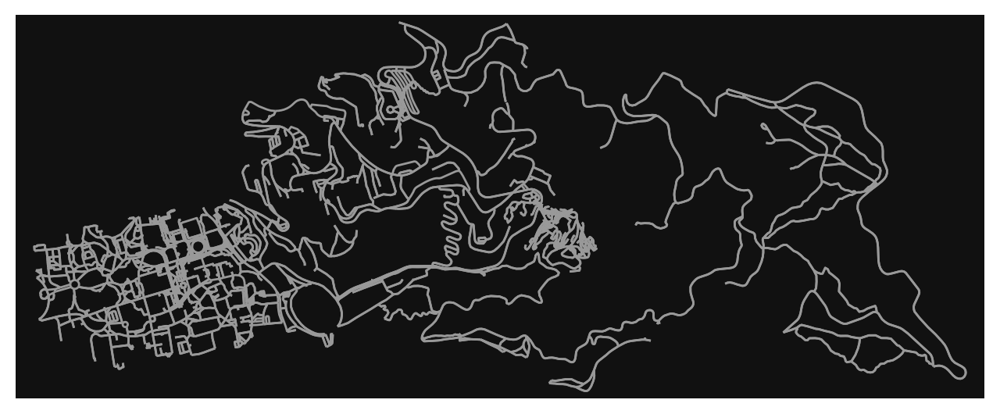

In [33]:
ox.plot_graph(ox.project_graph(berkeley), node_size=0);

### Streets within a specific polygon

**Example:** all streets within Northern Liberties and Fishtown

### First, let's wrangle some Zillow neighborhood boundaries


In [34]:
url = "https://github.com/azavea/geo-data/raw/master/Neighborhoods_Philadelphia/Neighborhoods_Philadelphia.geojson"
hoods = gpd.read_file(url).rename(columns={"mapname": "neighborhood"})

In [35]:
hoods.head()

,name,listname,neighborhood,shape_leng,shape_area,cartodb_id,created_at,updated_at,geometry
0,PENNYPACK_PARK,Pennypack Park,Pennypack Park,87084.285589,6.014076e+07,9,2013-03-19T17:41:50.507999+00:00,2013-03-19T17:41:50.743000+00:00,"MULTIPOLYGON (((-75.05645 40.08743, -75.05667 ..."
1,OVERBROOK,Overbrook,Overbrook,57004.924607,7.692499e+07,138,2013-03-19T17:41:50.507999+00:00,2013-03-19T17:41:50.743000+00:00,"MULTIPOLYGON (((-75.22719 39.97740, -75.22984 ..."
2,GERMANTOWN_SOUTHWEST,"Germantown, Southwest",Southwest Germantown,14880.743608,1.441867e+07,59,2013-03-19T17:41:50.507999+00:00,2013-03-19T17:41:50.743000+00:00,"MULTIPOLYGON (((-75.16208 40.02829, -75.16145 ..."
3,EAST_PARKSIDE,East Parkside,East Parkside,10885.781535,4.231000e+06,129,2013-03-19T17:41:50.507999+00:00,2013-03-19T17:41:50.743000+00:00,"MULTIPOLYGON (((-75.19931 39.97462, -75.19869 ..."
4,GERMANY_HILL,Germany Hill,Germany Hill,13041.939087,6.949968e+06,49,2013-03-19T17:41:50.507999+00:00,2013-03-19T17:41:50.743000+00:00,"MULTIPOLYGON (((-75.22722 40.03523, -75.22865 ..."


Trim to Fishtown and Northern Liberties

In [36]:
sel = hoods['neighborhood'].isin(['Fishtown - Lower Kensington', 'Northern Liberties'])
nolibs_fishtown = hoods.loc[sel]

In [37]:
nolibs_fishtown.head()

,name,listname,neighborhood,shape_leng,shape_area,cartodb_id,created_at,updated_at,geometry
105,FISHTOWN,Fishtown - Lower Kensington,Fishtown - Lower Kensington,25973.395800,3.360583e+07,87,2013-03-19T17:41:50.507999+00:00,2013-03-19T17:41:50.743000+00:00,"MULTIPOLYGON (((-75.12718 39.96086, -75.13048 ..."
106,NORTHERN_LIBERTIES,Northern Liberties,Northern Liberties,20685.015399,2.031376e+07,89,2013-03-19T17:41:50.507999+00:00,2013-03-19T17:41:50.743000+00:00,"MULTIPOLYGON (((-75.12718 39.96086, -75.12959 ..."


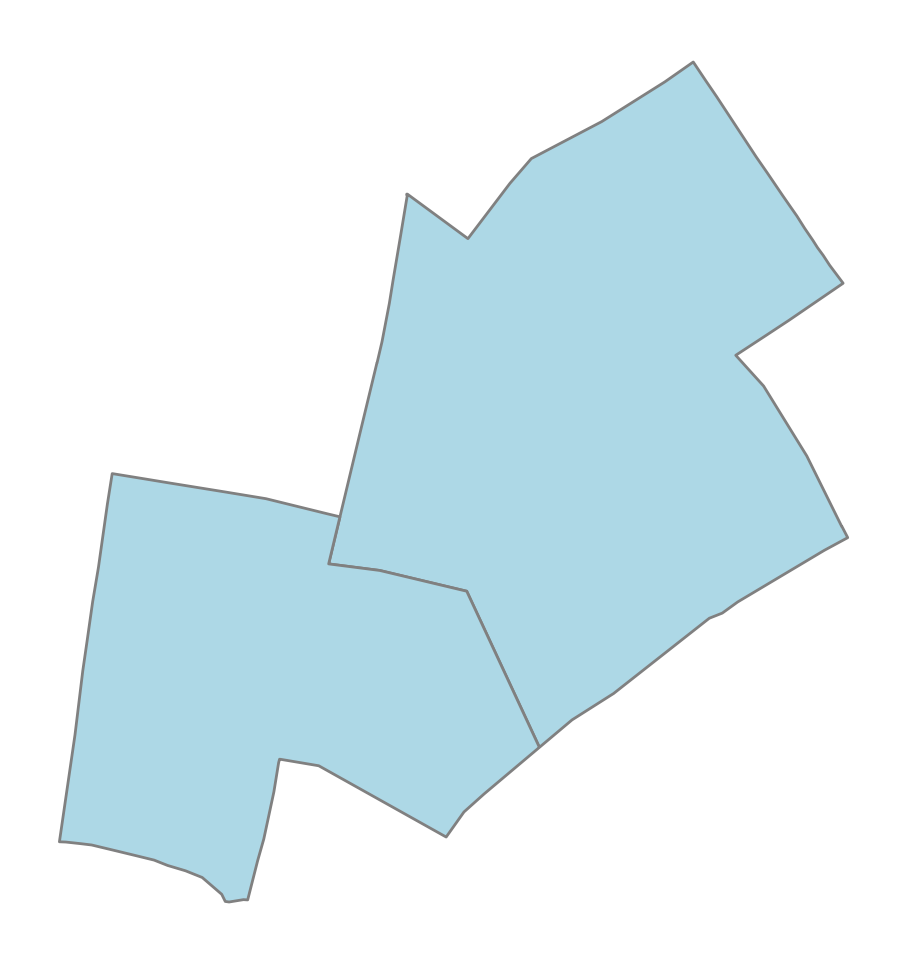

In [38]:
ax = ox.project_gdf(nolibs_fishtown).plot(fc="lightblue", ec="gray")
ax.set_axis_off()

### Extract streets within these polygons

- Take the union of the polygons: `unary_union`
- Use `ox.graph_from_polygon()`

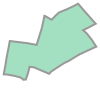

In [39]:
nolibs_fishtown_outline = nolibs_fishtown.geometry.unary_union
nolibs_fishtown_outline

In [122]:
type(nolibs_fishtown_outline)

shapely.geometry.polygon.Polygon

In [40]:
# get the graph
G_nolibs_fishtown = ox.graph_from_polygon(nolibs_fishtown_outline, network_type='drive')

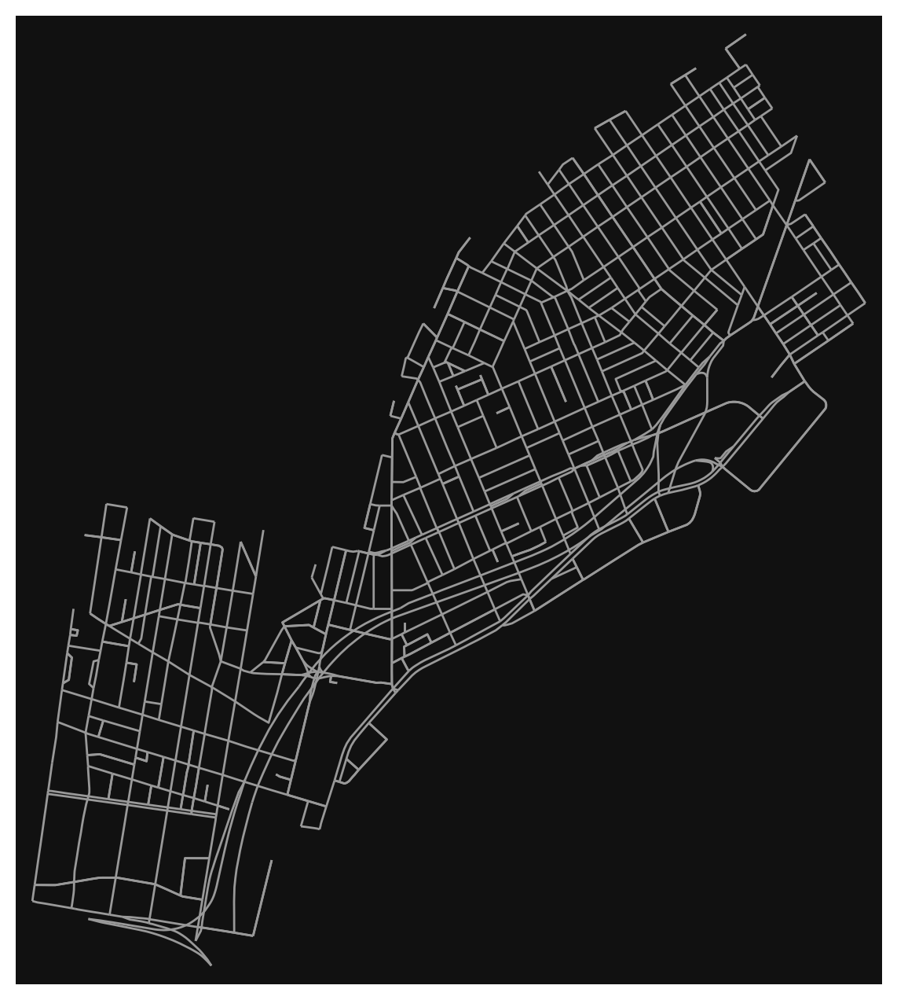

In [41]:
# viola!
ox.plot_graph(ox.project_graph(G_nolibs_fishtown), node_size=0);

We could also use `unary_union.convex_hull`. This will be an encompassing polygon around any set of geometries.

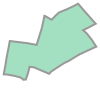

In [125]:
nolibs_fishtown.geometry.unary_union

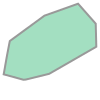

In [42]:
nolibs_fishtown.geometry.unary_union.convex_hull

## 1.5 Converting from a graph to a GeoDataFrame

Key function: `ox.graph_to_gdfs()` ([docs](https://osmnx.readthedocs.io/en/stable/osmnx.html?highlight=graph_to_gdf#osmnx.utils_graph.graph_to_gdfs))

You can get a GeoDataFrame for both the nodes (points) and edges (lines)

In [43]:
type(G_nolibs_fishtown)

networkx.classes.multidigraph.MultiDiGraph

In [44]:
# only get the edges
nolibs_edges = ox.graph_to_gdfs(G_nolibs_fishtown, 
                                edges=True, 
                                nodes=False)


In [45]:
# we have lots of data associated with each edge!
nolibs_edges.head()

osmid  oneway               name  \
u         v         key                                                      
109729430 109729453 0                  12109175    True   North 5th Street   
                    1                 789845372    True   North 5th Street   
109729453 109729801 0                 789845372    True   North 5th Street   
109729699 109811674 0    [424804073, 121643778]    True  Callowhill Street   
          109729709 0     [633770802, 41959235]    True   North 5th Street   

                             highway reversed   length  \
u         v         key                                  
109729430 109729453 0    residential    False  117.685   
                    1       tertiary    False   97.779   
109729453 109729801 0       tertiary    False   32.185   
109729699 109811674 0          trunk    False  135.768   
          109729709 0      secondary    False   90.451   

                                                                  geometry  \
u         v         key                                                      
109729430 109729453 0    LINESTRING (-75.14637 39.96458, -75.14655 39.9...   
                    1    LINESTRING (-75.14637 39.96458, -75.14627 39.9...   
109729453 109729801 0    LINESTRING (-75.14617 39.96544, -75.14609 39.9...   
109729699 109811674 0    LINESTRING (-75.14724 39.95779, -75.14739 39.9...   
          109729709 0    LINESTRING (-75.14724 39.95779, -75.14722 39.9...   

                        lanes maxspeed bridge  ref  
u         v         key                             
109729430 109729453 0     NaN      NaN    NaN  NaN  
                    1     NaN      NaN    NaN  NaN  
109729453 109729801 0     NaN      NaN    NaN  NaN  
109729699 109811674 0       5   35 mph    NaN  NaN  
          109729709 0     NaN      NaN    NaN  NaN

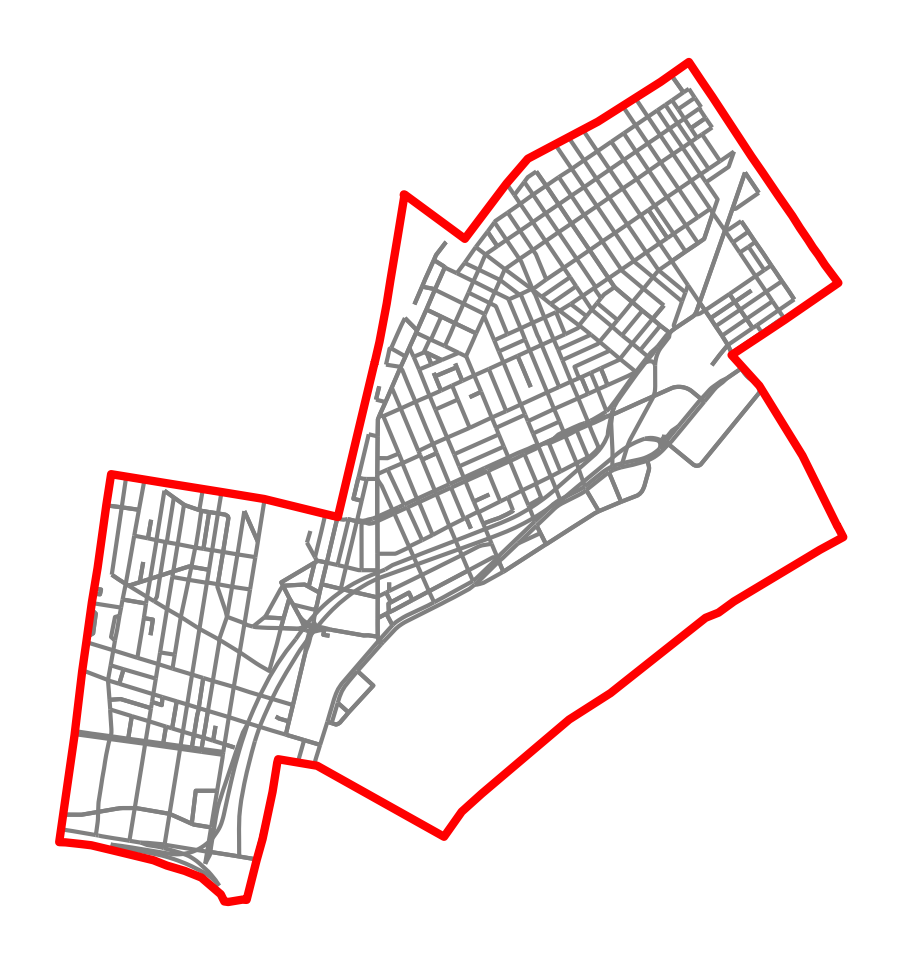

In [46]:
# plot it like any old GeoDataFrame
ax = nolibs_edges.to_crs(epsg=3857).plot(color='gray')

# add the neighborhood boundaries
boundary = gpd.GeoSeries([nolibs_fishtown_outline], crs='EPSG:4326')
boundary.to_crs(epsg=3857).plot(ax=ax, facecolor='none', edgecolor='red', linewidth=3, zorder=2)

ax.set_axis_off()

## 1.6 What can we do with the graph?

- Network-based statistics
- Routing
- Street orientations
- Visualizing crashes

And much more: see the [OSMnx repository of Jupyter notebook examples](https://github.com/gboeing/osmnx-examples/tree/master/notebooks)

## Network statistics

We can use the `ox.basic_stats()` to get some basic network statistics

In [47]:
ox.basic_stats(G_nolibs_fishtown)

{'n': 629,
 'm': 1229,
 'k_avg': 3.9077901430842608,
 'edge_length_total': 103561.27499999995,
 'edge_length_avg': 84.26466639544341,
 'streets_per_node_avg': 3.379968203497615,
 'streets_per_node_counts': {0: 0, 1: 18, 2: 2, 3: 342, 4: 259, 5: 6, 6: 2},
 'streets_per_node_proportions': {0: 0.0,
  1: 0.028616852146263912,
  2: 0.003179650238473768,
  3: 0.5437201907790143,
  4: 0.4117647058823529,
  5: 0.009538950715421303,
  6: 0.003179650238473768},
 'intersection_count': 611,
 'street_length_total': 86326.12299999999,
 'street_segment_count': 1009,
 'street_length_avg': 85.55611793855302,
 'circuity_avg': 1.0165046392413242,
 'self_loop_proportion': 0.0}

## Finding the shortest route

We can use the [`networkx`](https://networkx.org/documentation/networkx-2.5/index.html) package to do network-based calculations.

In [48]:
import networkx as nx

Let's calculate the shortest route between [Frankford Hall](https://www.openstreetmap.org/node/3306921057) (a bar in Fishtown) and the [Spring Garden subway station](https://www.openstreetmap.org/node/5358095953):

In [49]:
# Get all food and drink places within our Fishtown/No Libs polygon
fishtown_food_drink = ox.geometries_from_polygon(nolibs_fishtown_outline, 
                                                 tags={"amenity": ["restaurant", "bar", "pub"]})

In [51]:
len(fishtown_food_drink)

68

In [52]:
fishtown_food_drink.head()

addr:city addr:housenumber addr:postcode  \
element_type osmid                                                     
node         357303425   Philadelphia              500         19123   
             1475230378  Philadelphia             1001         19123   
             1712028161  Philadelphia              901         19123   
             1712044411           NaN              NaN           NaN   
             1712050828           NaN              931         19123   

                        addr:state              addr:street     amenity  \
element_type osmid                                                        
node         357303425          PA     Spring Garden Street         bar   
             1475230378        NaN         North 2nd Street         bar   
             1712028161        NaN         North 2nd Street  restaurant   
             1712044411        NaN  thompson and susquahana         pub   
             1712050828        NaN         North 2nd Street  restaurant   

                        brewery    craft gnis:county_id microbrewery  \
element_type osmid                                                     
node         357303425      yes  brewery            101          yes   
             1475230378     NaN      NaN            NaN          NaN   
             1712028161     NaN      NaN            NaN          NaN   
             1712044411     NaN      NaN            NaN          NaN   
             1712050828     NaN      NaN            NaN          NaN   

                                             name               operator  \
element_type osmid                                                         
node         357303425      Yards Brewing Company  Yards Brewing Company   
             1475230378              Gunner's Run                    NaN   
             1712028161              Standard Tap                    NaN   
             1712044411  Les n Doreen's Happy Tap                    NaN   
             1712050828      Cantina Dos Segundos                    NaN   

                        restaurant                              website  \
element_type osmid                                                        
node         357303425         yes            https://yardsbrewing.com/   
             1475230378        NaN               http://gunnersrun.com/   
             1712028161        NaN                      standardtap.com   
             1712044411        NaN                                  NaN   
             1712050828        NaN  https://www.cantinadossegundos.com/   

                          wikidata                 wikipedia  \
element_type osmid                                             
node         357303425   Q16903914  en:Yards Brewing Company   
             1475230378        NaN                       NaN   
             1712028161        NaN                       NaN   
             1712044411        NaN                       NaN   
             1712050828        NaN                       NaN   

                                           geometry      opening_hours  \
element_type osmid                                                       
node         357303425   POINT (-75.14712 39.96067)                NaN   
             1475230378  POINT (-75.14002 39.96627)  Mo-Su 11:00-02:00   
             1712028161  POINT (-75.14057 39.96416)                NaN   
             1712044411  POINT (-75.12558 39.97373)                NaN   
             1712050828  POINT (-75.14042 39.96483)                NaN   

                                 phone addr:housename designation  cuisine  \
element_type osmid                                                           
node         357303425             NaN            NaN         NaN      NaN   
             1475230378   215-923-4600            NaN         NaN      NaN   
             1712028161  215 -238-0630            NaN         NaN      NaN   
             1712044411            NaN  the happy tap  local dive      NaN 

In [53]:
# Select Frankford Hall based on the name column
frankford_hall = fishtown_food_drink.query("name == 'Frankford Hall'").squeeze()

# Get the x/y coordinates
frankford_hall_x = frankford_hall.geometry.x
frankford_hall_y = frankford_hall.geometry.y

In [56]:
frankford_hall_y

39.9694855

In [57]:
# Get all subway stations within our Fishtown/No Libs polygon
fishtown_subway_stops = ox.geometries_from_polygon(nolibs_fishtown_outline, 
                                                   tags={"railway": "station"})

In [58]:
# Select Spring Garden based on the name column
spring_garden_station = fishtown_subway_stops.query("name == 'Spring Garden'").squeeze()

# Get the x/y coordinates
spring_garden_x = spring_garden_station.geometry.x
spring_garden_y = spring_garden_station.geometry.y

Find the nearest nodes on our OSMnx graph:

In [59]:
# Get the origin node
orig_node = ox.distance.nearest_nodes(G_nolibs_fishtown,  spring_garden_x, spring_garden_y) 

# Get the destination node
dest_node = ox.distance.nearest_nodes(G_nolibs_fishtown, frankford_hall_x, frankford_hall_y) 

Use `networkx` to find the shortest path between these graph nodes

In [61]:
orig_node

110156961

In [60]:
# get the shortest path --> just a list of node IDs
route = nx.shortest_path(G_nolibs_fishtown, 
                         orig_node, 
                         dest_node, 
                         weight='length')
route

[110156961,
 110156976,
 110240102,
 110240110,
 110156990,
 110408354,
 110150984,
 110151026,
 109812663,
 3405862196,
 110274404,
 786190278,
 786189685,
 786189751,
 786190146,
 786189922,
 110227372,
 110549183,
 110207010,
 7738710013,
 7738710015,
 1479201402,
 1479201356,
 1479201380,
 1479201400,
 1479201370,
 7741504690,
 1479201401,
 110447508,
 109990294,
 109834418,
 109921057,
 109801805,
 109801799,
 109998370]

Use `ox.plot_graph_route()` to plot a graph and highlight a specific route

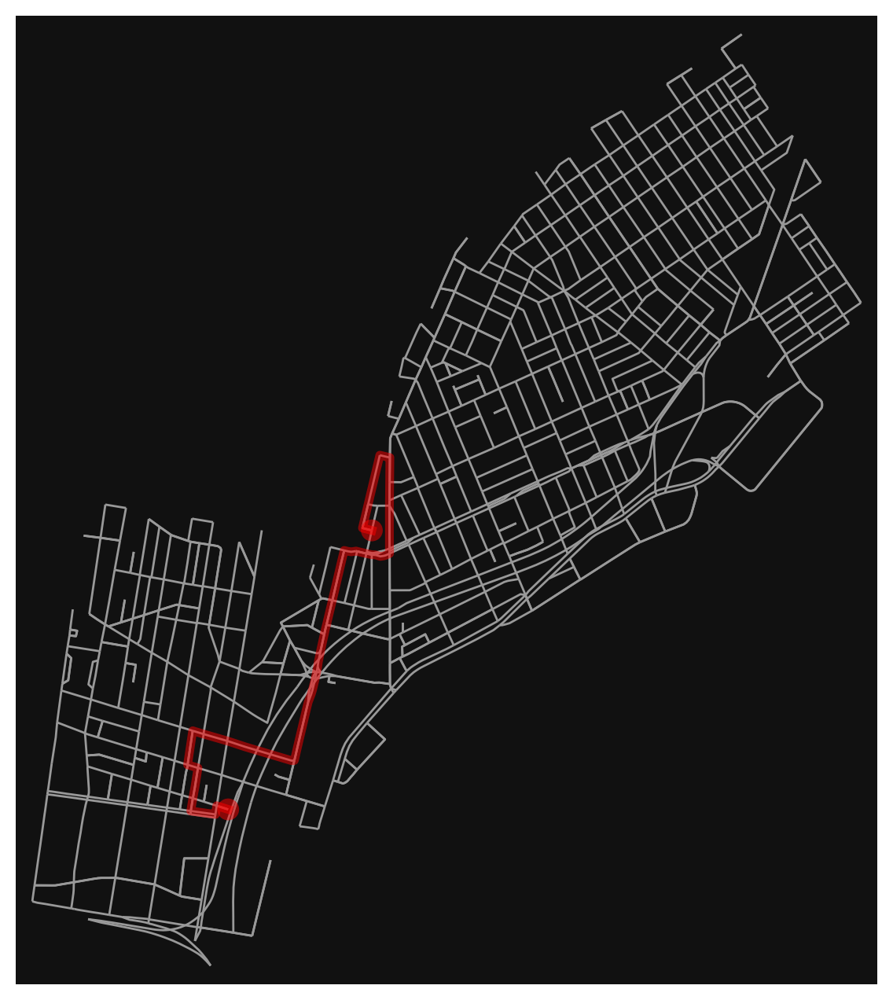

In [62]:
ox.plot_graph_route(G_nolibs_fishtown, route, node_size=0);

## Part 2:  Pandana

"Pandas Network Analysis - dataframes of network queries, quickly"

A complementary set of OSM-related features: 
- Downloading OSM-based networks
- Extracting amenity data (so-called "Points of Interest")
- Calculating network-constrained distances

- [GitHub](https://github.com/UDST/pandana)
- [Jupyter Notebook Examples](https://github.com/UDST/pandana/tree/master/examples)
- [Documentation](http://udst.github.io/pandana/)

In [64]:
import pandana as pnda
from pandana.loaders import osm

### Step 1: Get amenity data

Key function: `osm.node_query()`

- This will extract amenities within a given bounding box.
- Similar to the `ox.geometries_from_bbox()` function in OSMnx, but we slightly different syntax.

In [141]:
osm.node_query?

Signature: osm.node_query(lat_min, lng_min, lat_max, lng_max, tags=None)
Docstring:
Search for OSM nodes within a bounding box that match given tags.

Parameters
----------
lat_min, lng_min, lat_max, lng_max : float
tags : str or list of str, optional
    Node tags that will be used to filter the search.
    See http://wiki.openstreetmap.org/wiki/Overpass_API/Language_Guide
    for information about OSM Overpass queries
    and http://wiki.openstreetmap.org/wiki/Map_Features
    for a list of tags.

Returns
-------
nodes : pandas.DataFrame
    Will have 'lat' and 'lon' columns, plus other columns for the
    tags associated with the node (these will vary based on the query).
    Index will be the OSM node IDs.
File:      ~/mambaforge/envs/musa-550-fall-2022/lib/python3.9/site-packages/pandana/loaders/osm.py
Type:      function


Get the bounding box for Northern Liberties / Fishtown:

In [65]:
boundary = nolibs_fishtown_outline.bounds
boundary

(-75.14891, 39.955458, -75.113226, 39.984757)

In [68]:
[lng_min, lat_min, lng_max, lat_max] = boundary

In [69]:
# query OSM
poi_df = osm.node_query(lat_min, lng_min, lat_max, lng_max)

# remove missing data
poi_df = poi_df.dropna(subset=['amenity'])

In [70]:
poi_df.head()

,lat,lon,highway,traffic_signals,railway,old_ref,ref,noref,name,stop,crossing,traffic_signals:direction,direction,disused:railway,ele,gnis:Class,gnis:County,gnis:County_num,gnis:ST_alpha,gnis:ST_num,gnis:id,import_uuid,is_in,place,wikidata,wikipedia,addr:city,addr:housenumber,addr:postcode,addr:street,opening_hours,phone,shop,website,alt_name,amenity,gnis:county_id,gnis:created,gnis:feature_id,gnis:state_id,historic:amenity,note,comment,old_name,addr:state,brewery,craft,microbrewery,operator,restaurant,man_made,gnis:county_name,gnis:import_uuid,gnis:reviewed,network,public_transport,subway,brand,brand:wikidata,brand:wikipedia,platforms,station,wheelchair,cuisine,disused:amenity,denomination,religion,tactile_paving,capacity,source:pkey,addr:housename,building,designation,payment:bitcoin,addr:full,description,diet:vegetarian,internet_access,short_name,tram,bus,drive_in,outdoor_seating,smoking,takeaway,drink:club-mate,internet_access:fee,contact:phone,email,social_facility,leisure,healthcare,sport,is_in:state_code,population,collection_times,operator:short,operator:type,operator:wikidata,operator:wikipedia,compost,farm_boxes,addr:place,addr:country,atm,air_conditioning,crossing:island,barrier,foot,motor_vehicle,emergency,access,fee,toilets:disposal,unisex,fax,fixme,branch,official_name,animal,delivery,tourism,addr:unit,crossing_ref,payment:cash,payment:cheque,payment:credit_cards,diet:vegan,beds,advertising,lit,artwork_type,entrance,office,diet:dairy,organic,payment:credit_card,communication:mobile_phone,tower:type,facebook,playground,drive_through,locked,level,historic,disused:leisure,construction:amenity,natural,kerb,books,demolished:leisure,opening_hours:covid19,twitter,min_age,artist_name,bicycle_parking,covered,generator:method,generator:output:electricity,generator:source,generator:type,power,flag:type,traffic_calming,support,bridge:support
id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
357274893,39.972335,-75.130176,NaN,NaN,NaN,NaN,NaN,NaN,Adaire Alexander School,NaN,NaN,NaN,NaN,NaN,7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Adaire School,school,101,08/02/1979,1168055,42,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
357283515,39.976497,-75.116743,NaN,NaN,NaN,NaN,NaN,NaN,Maritime Academy Charter High School,NaN,NaN,NaN,NaN,NaN,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,school,101,08/02/1979,1173424,42,NaN,NaN,Stephen A. Douglas High School closed in 2013,Stephen A. Douglas High School,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
357288962,39.981243,-75.126783,NaN,NaN,NaN,NaN,NaN,NaN,Horatio B. Hackett School,NaN,NaN,NaN,NaN,NaN,8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Hackett School,school,101,08/02/1979,1176347,42,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

In [71]:
len(poi_df)

227

In [72]:
poi_df[['lat', 'lon', 'amenity']].head(10)

,lat,lon,amenity
id,,,
357274893,39.972335,-75.130176,school
357283515,39.976497,-75.116743,school
357288962,39.981243,-75.126783,school
357297150,39.983189,-75.141190,school
357303425,39.960668,-75.147121,bar
357373853,39.972874,-75.127243,school
367962776,39.978845,-75.118371,fire_station
1475159482,39.969869,-75.144829,place_of_worship
1475229905,39.967481,-75.139696,disused


### Explore the amenities in this region

For the full list of amenities, see the [OSM Wikipedia](https://wiki.openstreetmap.org/wiki/Key:amenity)

In [73]:
chart = (
    alt.Chart(poi_df)
    .mark_bar()
    .encode(y=alt.Y("amenity", sort="-x"), x="count()", tooltip=["amenity", "count()"])
)

chart

alt.Chart(...)

### Step 2: Create a Pandana network

- Key function: `pdna_network_from_bbox()` 
- It takes a bounding box and returns the OSM network within that region. 
- Multiple network types: 'walk' and 'drive'

In [74]:
net = osm.pdna_network_from_bbox(
    lat_min, lng_min, lat_max, lng_max, network_type="walk"
)

/Users/nhand/mambaforge/envs/musa-550-fall-2022/lib/python3.9/site-packages/osmnet/load.py:445: FutureWarning: Assigning CRS to a GeoDataFrame without a geometry column is now deprecated and will not be supported in the future.
  gdf.crs = crs
/Users/nhand/mambaforge/envs/musa-550-fall-2022/lib/python3.9/site-packages/pyproj/crs/crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
/Users/nhand/mambaforge/envs/musa-550-fall-2022/lib/python3.9/site-packages/osmnet/load.py:445: FutureWarning: Assigning CRS to a GeoDataFrame without a geometry column is now deprecated and will not be supported in the future.
  gdf.crs = crs
/Users/nhand/mambaforge/envs/musa-550-fall-2022/lib/python3.9/site-packages/osmnet/load.p

Requesting network data within bounding box from Overpass API in 1 request(s)
Posting to http://www.overpass-api.de/api/interpreter with timeout=180, "{'data': '[out:json][timeout:180];(way["highway"]["highway"!~"motor|proposed|construction|abandoned|platform|raceway"]["foot"!~"no"]["pedestrians"!~"no"](39.95545800,-75.14891000,39.98475700,-75.11322600);>;);out;'}"


/Users/nhand/mambaforge/envs/musa-550-fall-2022/lib/python3.9/site-packages/osmnet/load.py:237: DeprecationWarning: Flags not at the start of the expression '//(?s)(.*?)/' but at position 2
  domain = re.findall(r'//(?s)(.*?)/', url)[0]
/Users/nhand/mambaforge/envs/musa-550-fall-2022/lib/python3.9/site-packages/osmnet/load.py:171: ShapelyDeprecationWarning: __len__ for multi-part geometries is deprecated and will be removed in Shapely 2.0. Check the length of the `geoms` property instead to get the  number of parts of a multi-part geometry.
  ' {:,.2f} seconds'.format(len(geometry), time.time()-start_time))


Downloaded 1,889.5KB from www.overpass-api.de in 1.12 seconds
Downloaded OSM network data within bounding box from Overpass API in 1 request(s) and 1.18 seconds
Returning OSM data with 10,476 nodes and 3,323 ways...
Edge node pairs completed. Took 1.11 seconds
Returning processed graph with 5,058 nodes and 7,666 edges...
Completed OSM data download and Pandana node and edge table creation in 2.39 seconds
Generating contraction hierarchies with 10 threads.
Setting CH node vector of size 5058
Setting CH edge vector of size 7732
Range graph removed 298 edges of 15464
. 10% . 20% . 30% . 40% . 50% . 60% . 70% . 80% . 90% . 100%


### Step 3: Tell the network the location of amenities

Key function: `network.set_pois()`

- Today, we'll explore these four amenities: "restaurant", "bar", "school", "car_sharing"
- **IMPORTANT:** if you want to explore other amenities, you'll need to run the code below for your amenities of interest

In [79]:
# sensible defaults
max_distance = 2000  # in meters
num_pois = 10  # only need the 10 nearest POI to each point in the network


AMENITIES = ["restaurant", "bar", "school", "car_sharing"]
for amenity in AMENITIES:

    # get the subset of amenities for this type
    pois_subset = poi_df[poi_df["amenity"] == amenity]

    # set the POI, using the longitude and latitude of POI
    net.set_pois(
        amenity, max_distance, num_pois, pois_subset["lon"], pois_subset["lat"]
    )

/Users/nhand/mambaforge/envs/musa-550-fall-2022/lib/python3.9/site-packages/pandana/network.py:660: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  elif isinstance(maxitems, type(pd.Series())):
/Users/nhand/mambaforge/envs/musa-550-fall-2022/lib/python3.9/site-packages/pandana/network.py:668: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  elif isinstance(maxdist, type(pd.Series())):
/Users/nhand/mambaforge/envs/musa-550-fall-2022/lib/python3.9/site-packages/pandana/network.py:660: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  elif isinstance(maxitems, type(pd.Series())):
/Users/nhand/mambaforge/envs/musa-550-fall-2022/lib/python3.9/site-package

In [80]:
# keyword arguments to pass for the matplotlib figure
bbox_aspect_ratio = (lat_max - lat_min) / (lng_max - lng_min)
fig_kwargs = {"facecolor": "w", "figsize": (10, 10 * bbox_aspect_ratio)}

# keyword arguments to pass for scatter plots
plot_kwargs = {"s": 20, "alpha": 0.9, "cmap": "viridis_r", "edgecolor": "none"}

### Step 4: Plot the walking distance to the nearest POI

For every point on the network, find the nth nearest POI, calculate the distance, and color that point according to the distance.

1. Use `network.nearest_poi()` to get distances from nodes to nearest POIs
1. Merge coordinates of network nodes with distances to nearest POIs
1. Plot the node coordinates, colored by distance to nth nearest POI

### 1. Use `network.nearest_poi()` to get distances from nodes to nearest POIs

In [81]:
amenity = 'bar'
access = net.nearest_pois(distance=2000, 
                          category=amenity, 
                          num_pois=num_pois)

In [82]:
access.head(n=20)

,1,2,3,4,5,6,7,8,9,10
id,,,,,,,,,,
103353219,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
103357134,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
103357139,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
103407531,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
103407534,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
103417453,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
103426172,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
103426218,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
103439886,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000


### 2. Merge coordinates of network nodes with distances to nearest POIs

In [85]:
net.nodes_df.head()

,x,y
id,,
103353219,-75.115434,39.957472
103357134,-75.114734,39.954193
103357139,-75.113843,39.957221
103407531,-75.120641,39.955889
103407534,-75.119286,39.955627


In [86]:
access.head()

,1,2,3,4,5,6,7,8,9,10
id,,,,,,,,,,
103353219,2000.0,2000.0,2000.0,2000.0,2000.0,2000.0,2000.0,2000.0,2000.0,2000.0
103357134,2000.0,2000.0,2000.0,2000.0,2000.0,2000.0,2000.0,2000.0,2000.0,2000.0
103357139,2000.0,2000.0,2000.0,2000.0,2000.0,2000.0,2000.0,2000.0,2000.0,2000.0
103407531,2000.0,2000.0,2000.0,2000.0,2000.0,2000.0,2000.0,2000.0,2000.0,2000.0
103407534,2000.0,2000.0,2000.0,2000.0,2000.0,2000.0,2000.0,2000.0,2000.0,2000.0


In [89]:
# Merge the nodes and the distance to POIs
nodes = pd.merge(net.nodes_df, access, left_index=True, right_index=True)

# Make into a geodataframe
nodes = gpd.GeoDataFrame(
    nodes, geometry=gpd.points_from_xy(nodes["x"], nodes["y"]), crs="EPSG:4326"
)

In [90]:
nodes.head()

,x,y,1,2,3,4,5,6,7,8,9,10,geometry
id,,,,,,,,,,,,,
103353219,-75.115434,39.957472,2000.0,2000.0,2000.0,2000.0,2000.0,2000.0,2000.0,2000.0,2000.0,2000.0,POINT (-75.11543 39.95747)
103357134,-75.114734,39.954193,2000.0,2000.0,2000.0,2000.0,2000.0,2000.0,2000.0,2000.0,2000.0,2000.0,POINT (-75.11473 39.95419)
103357139,-75.113843,39.957221,2000.0,2000.0,2000.0,2000.0,2000.0,2000.0,2000.0,2000.0,2000.0,2000.0,POINT (-75.11384 39.95722)
103407531,-75.120641,39.955889,2000.0,2000.0,2000.0,2000.0,2000.0,2000.0,2000.0,2000.0,2000.0,2000.0,POINT (-75.12064 39.95589)
103407534,-75.119286,39.955627,2000.0,2000.0,2000.0,2000.0,2000.0,2000.0,2000.0,2000.0,2000.0,2000.0,POINT (-75.11929 39.95563)


### And now plot it!

Let's define a function to do this for us, since we'll repeat this plot multiple times

In [93]:
def plot_walking_distance(net, amenity, distance=1000, n=1):
    """
    Plot the walking distance to the specified amenity
    """
    from mpl_toolkits.axes_grid1 import make_axes_locatable

    # subset of POI
    poi_subset = poi_df[poi_df["amenity"] == amenity]

    # get the distances to nearest num_pois POI
    access = net.nearest_pois(distance=1000, category=amenity, num_pois=num_pois)

    # merge node positions and distances to nearest PO
    nodes = pd.merge(net.nodes_df, access, left_index=True, right_index=True)
    nodes = gpd.GeoDataFrame(
        nodes, geometry=gpd.points_from_xy(nodes["x"], nodes["y"]), crs="EPSG:4326"
    )

    # Create the figure
    fig, ax = plt.subplots(figsize=(10, 10))
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.1)

    # plot the distance to the nth nearest amenity
    ax = nodes.plot(ax=ax, cax=cax, column=nodes[n], legend=True, **plot_kwargs)

    # add the amenities as stars
    for i, row in poi_subset.iterrows():
        ax.scatter(row["lon"], row["lat"], color="red", s=100, marker="*")

    # format
    ax.set_facecolor("black")
    ax.figure.set_size_inches(fig_kwargs["figsize"])

    # set extent
    [xmin, ymin, xmax, ymax] = nodes.geometry.total_bounds
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)

    return ax

### Evaluating amenity choice

The difference between maps to the nearest amenity and for example, the 5th nearest amenity tells us about the options consumers have

### Example: bars

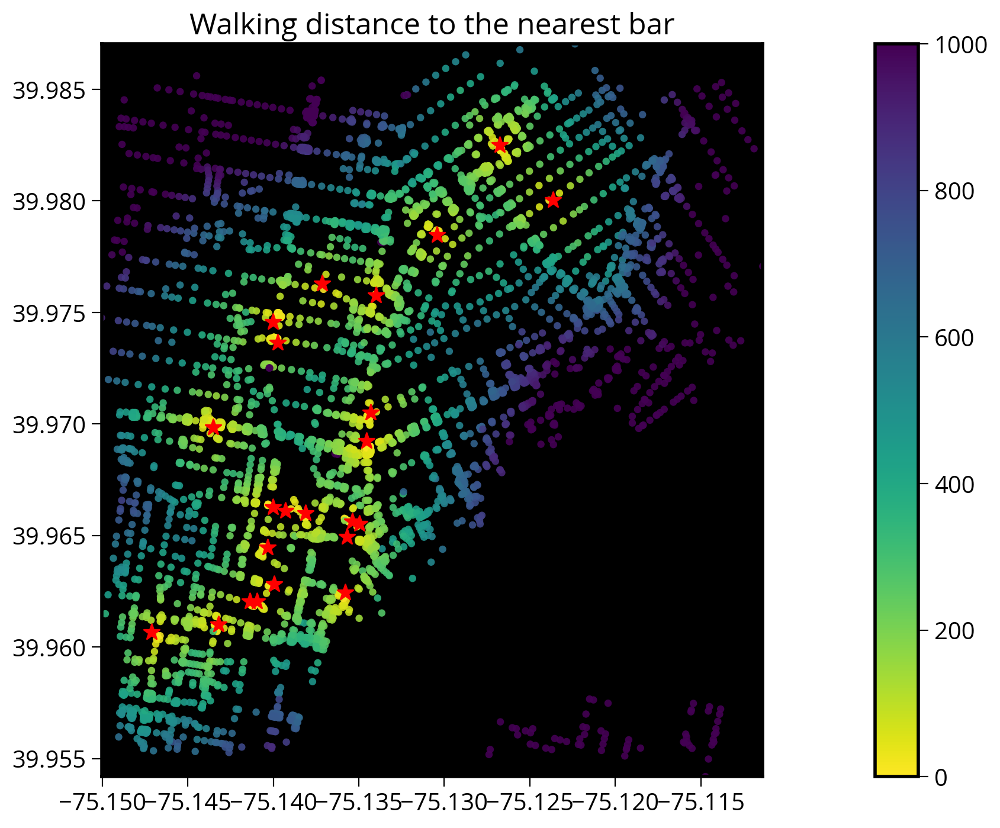

In [92]:
ax = plot_walking_distance(net, "bar", n=1)
ax.set_title("Walking distance to the nearest bar", fontsize=18);

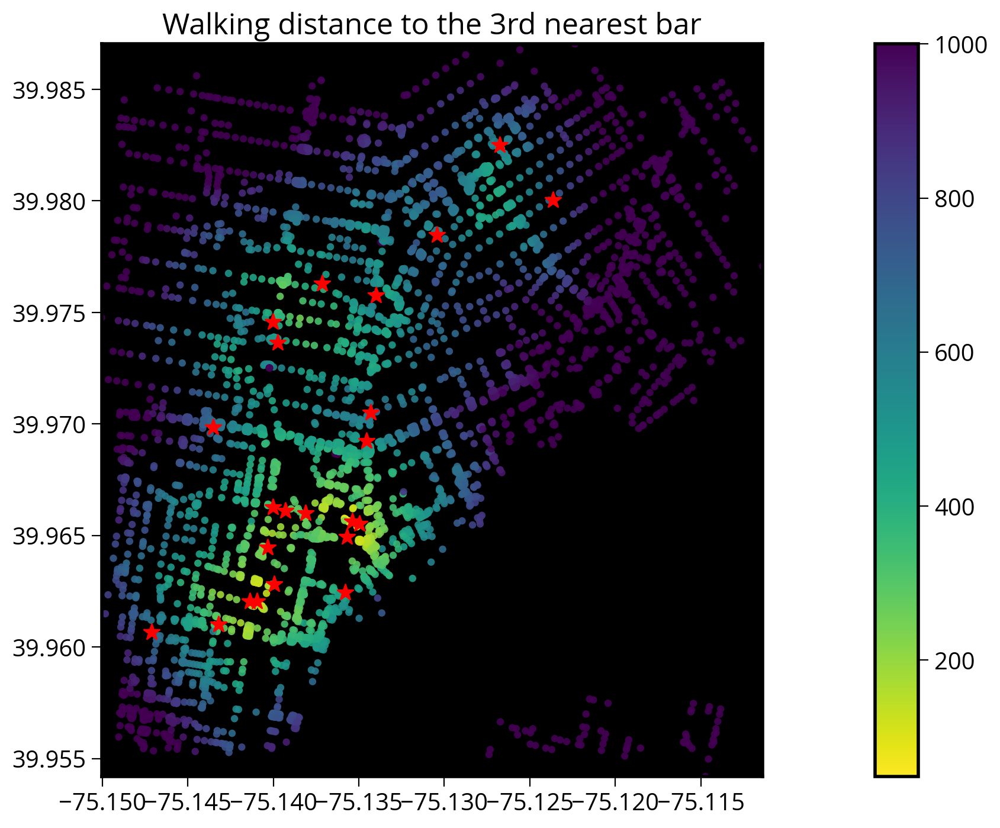

In [94]:
ax = plot_walking_distance(net, "bar", n=3)
ax.set_title("Walking distance to the 3rd nearest bar", fontsize=18);

### Example: schools

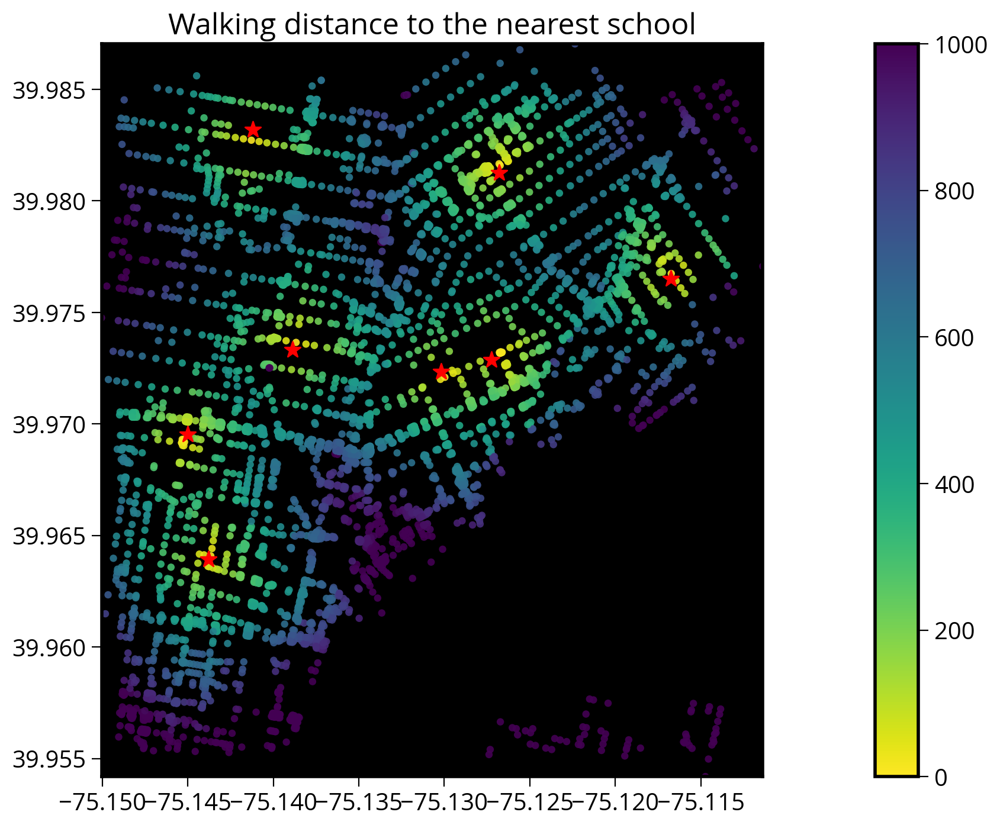

In [95]:
ax = plot_walking_distance(net, "school", n=1)
ax.set_title("Walking distance to the nearest school", fontsize=18);

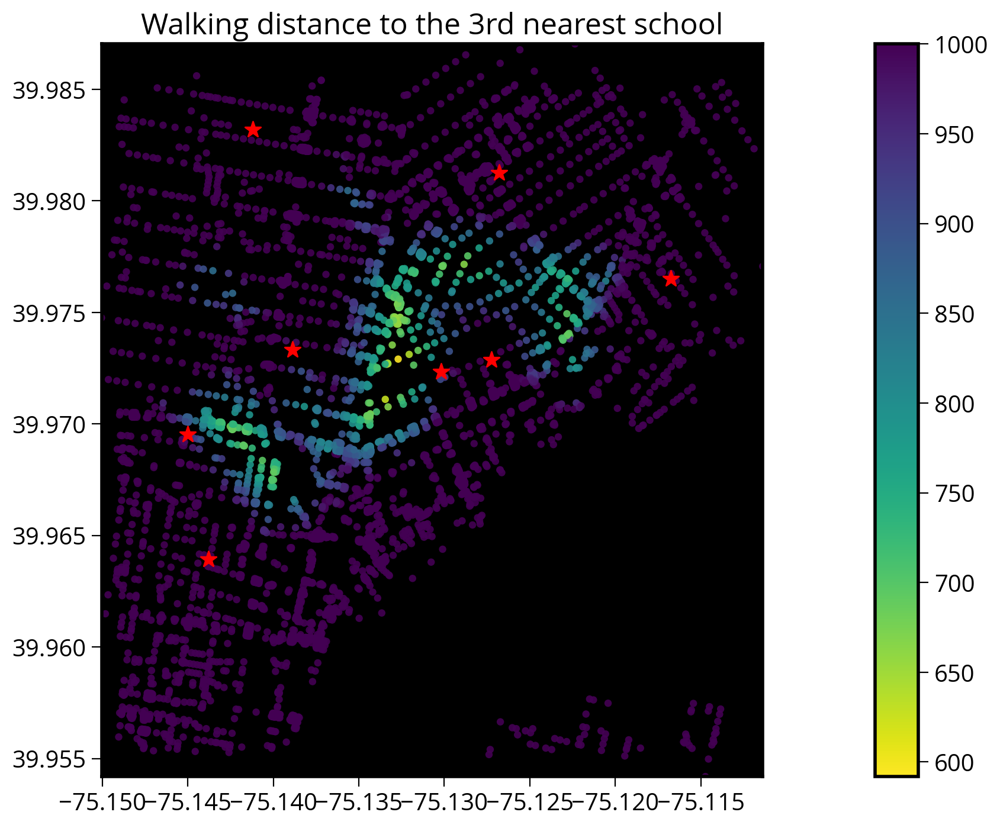

In [165]:
ax = plot_walking_distance(net, "school", n=3)
ax.set_title("Walking distance to the 3rd nearest school", fontsize=18);

### Example: restaurants

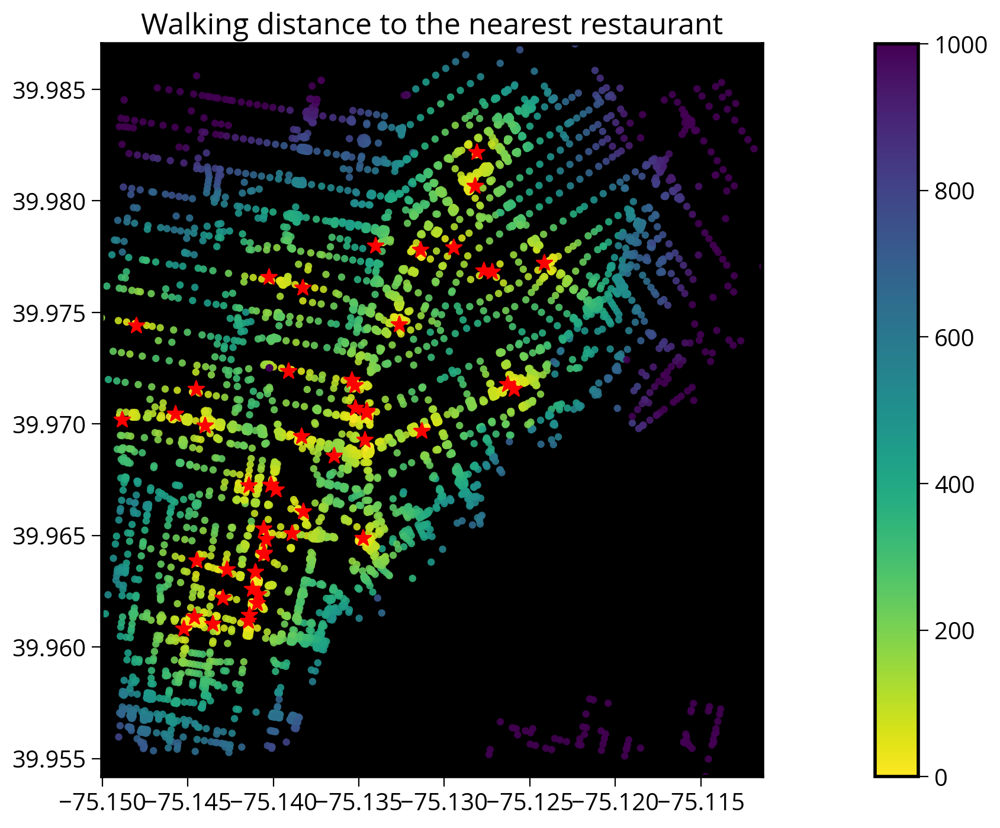

In [96]:
ax = plot_walking_distance(net, "restaurant", n=1)
ax.set_title("Walking distance to the nearest restaurant", fontsize=18);

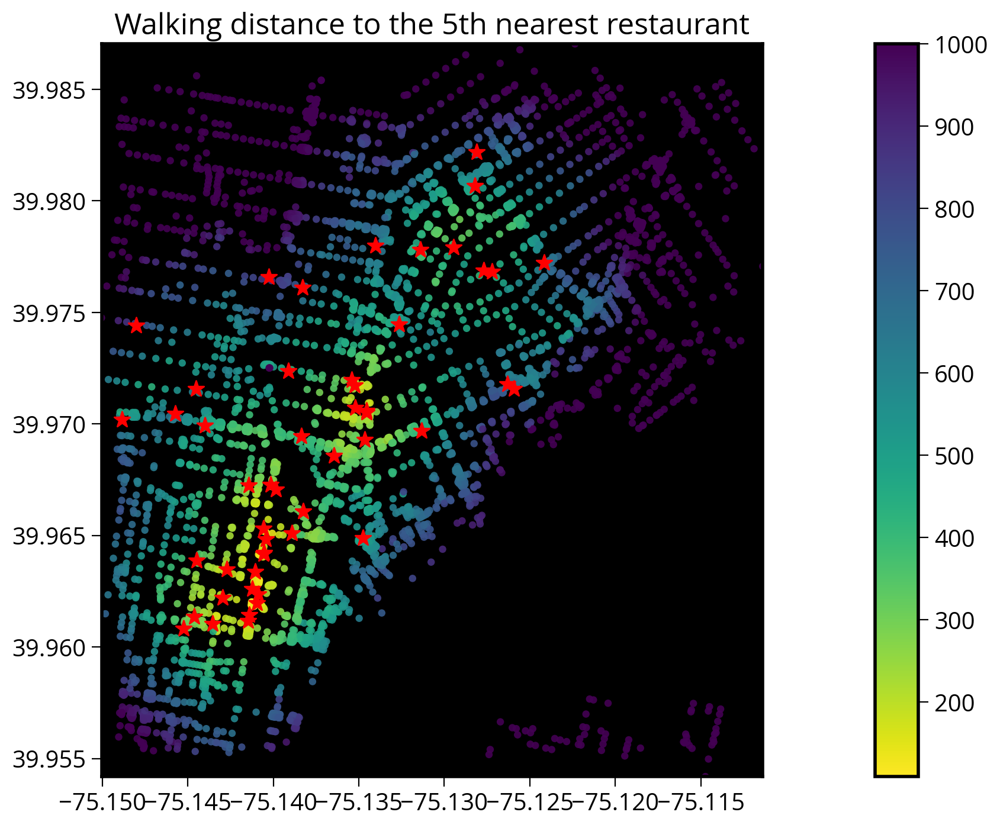

In [98]:
ax = plot_walking_distance(net, "restaurant", n=5)
ax.set_title("Walking distance to the 5th nearest restaurant", fontsize=18);

### Example: car sharing

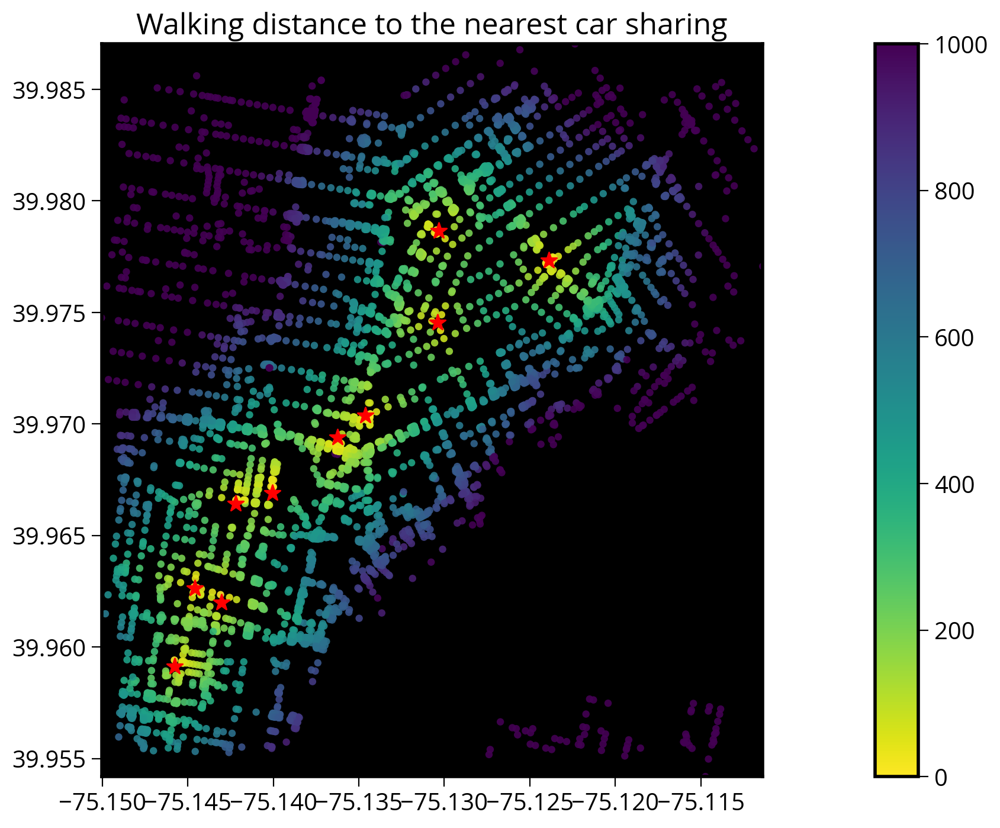

In [99]:
ax = plot_walking_distance(net, "car_sharing", n=1)
ax.set_title("Walking distance to the nearest car sharing", fontsize=18);

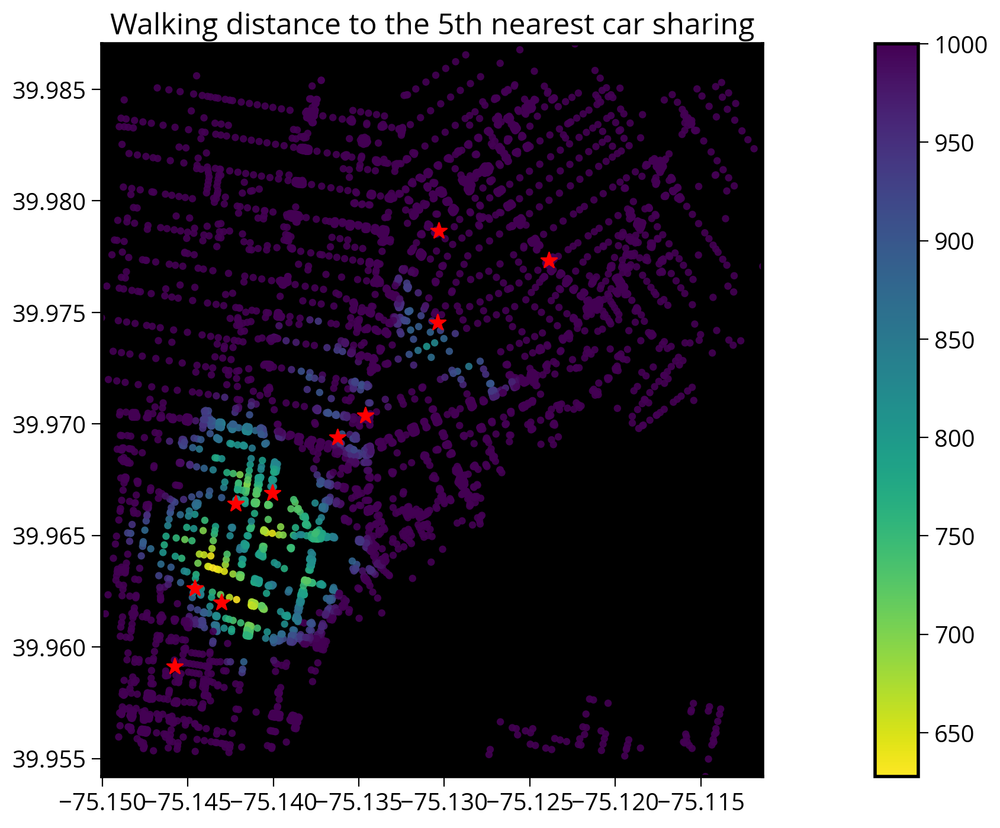

In [169]:
ax = plot_walking_distance(net, "car_sharing", n=5)
ax.set_title("Walking distance to the 5th nearest car sharing", fontsize=18);

## At-home exercise: Explore amenities in the neighborhood of your choice

Many, many more amenities are logged throughout the city. Pick your favorite neighborhood and explore. 

See [this page](https://wiki.openstreetmap.org/wiki/Key:amenity) for the full list of amenities.

**Final project idea**: With this kind of analysis, you can look at amenity-based influence in housing, neighborhood selection, etc. or something similar to the [Walk Score](https://www.walkscore.com/).